# **임대주택 단지 내 적정 주차수요 예측 대회_애널리틱스**

In [1]:
PATH = r'C:\Users\Wyatt\wyatt37\data\parking'

In [2]:
import pandas as pd
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100
from tabulate import tabulate

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

from matplotlib import font_manager, rc
font_path = "C:/Windows/Fonts/NGULIM.TTF"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

import warnings
warnings.filterwarnings("ignore")

In [3]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import LassoLars, HuberRegressor

In [4]:
from pycaret.regression import *

In [5]:
age_gender = pd.read_csv(PATH + '\\new_age_gender_info.csv')
train = pd.read_csv(PATH + '\\new_train.csv')
test = pd.read_csv(PATH + '\\new_test.csv')
sub = pd.read_csv(PATH + '\\new_sample_submission.csv')

# PREPROCESSING

In [6]:
# 컬럼명이 너무 긴 지하철과 버스만 바꿔주겠습니다.
train.rename({'도보 10분거리 내 지하철역 수(환승노선 수 반영)': '지하철',
             '도보 10분거리 내 버스정류장 수': '버스'}, axis=1, inplace=True)
test.rename({'도보 10분거리 내 지하철역 수(환승노선 수 반영)': '지하철',
             '도보 10분거리 내 버스정류장 수': '버스'}, axis=1, inplace=True)

## FILLNA

### Subway

In [7]:
# train set에 지하철 정보가 없는 경남, 충남은 0으로 보간
train.loc[(train['지역'].isin(['경상남도', '충청남도'])) & (train['지하철'].isnull()), '지하철'] = 0

In [8]:
# LH청약센터에서 찾은 주소로 확인한 대전의 8개 단지는 지하철이 없음
# 0으로 채워줍시다.

(train.loc[(train['지역'] == '대전광역시') & (train['지하철'].isnull()) , '지하철']) = 0

In [9]:
# test set에 지하철 정보가 없는 충남은 0으로 보간
test.loc[(test['지역'].isin(['충청남도'])) & (test['지하철'].isnull()), '지하철'] = 0

In [10]:
# LH청약센터에서 찾은 주소로 확인한 대전의 2개 단지는 지하철이 없음
# 0으로 채워줍시다.

(test.loc[(test['지역'] == '대전광역시') & (test['지하철'].isnull()), '지하철']) = 0

### Bus

In [11]:
# 버스정류장 결측치는 train set에 1개 단지에 존재
# 해당 단지는 양산신도시LH아파트 5단지
# 지도를 확인한 결과 보수적으로 잡아도 7개 이상

train.loc[train['버스'].isnull(), '버스'] = 7

### Rent

In [12]:
# test set 에 임대보증금과 임대료가 결측치인 1개 단지 존재
# 해당 단지는 대전둔산1단지주공아파트
# 공고문에 의거, 임대보증금과 임대료 아래와 같이 보간

test.loc[(test['임대건물구분'] != '상가') & (test['임대보증금'].isnull()), '임대보증금'] = [5787000, 5787000, 11574000]
test.loc[(test['임대건물구분'] != '상가') & (test['임대료'].isnull()), '임대료'] = [79980, 79980, 159960]

### Qualification

In [13]:
# C2411 아파트의 자격유형은 전부 A로 되어 있음.
# 동일하게 A로 보간

test.loc[(test['단지코드'] == 'C2411') & (test['자격유형'].isnull()), '자격유형'] = 'A'

In [14]:
# C2253 아파트의 자격유형은 전부 C로 되어 있음.
# 동일하게 C로 보간

test.loc[(test['단지코드'] == 'C2253') & (test['자격유형'].isnull()), '자격유형'] = 'C'

# INVESTIGATION

- 수사에 돌입하겠습니다.
- 정황파악(BA&DA) -> 가설설정 -> 증거수집(EDA) -> 추가 증거수집(DEEP EDA) -> 증거 조합 -> 인사이트 체포

아파트 단지 내 필요한 주차대수는 **①법정주차대수 ②장래주차수요 중 큰 값에 따라 결정**하게되어 있어, **정확한 ②장래주차수요의 산정을 필요**로 합니다.
현재 ②장래주차수요는 **‘주차원단위’**와 **‘건축연면적’**을 기초로하여 산출되고 있으며, **‘주차원단위’는 신규 건축예정 부지 인근의 유사 단지를 피크 시간대 방문하여 주차된 차량대수를 세는 방법으로 조사**하고 있습니다.
이 경우 인력조사로 인한 오차발생, 현장조사 시점과 실제 건축시점과의 시간차 등의 문제로 과대 또는 과소 산정의 가능성을 배제할 수 없습니다.

위 정보에서 알 수 있는 것은 무조건 최소한 법정주차대수보다는 높게 선정해야 한다는 것이다.
- 장래주차수요가 적은 경우 -> 법정주차대수로 결정
- 장래주차수요가 큰 경우 -> 법정주차대수보다 큰 장래주차수요로 결정
- 어떤 경우에도 최소한 법정주차대수보다 큼

법정주차대수는 1995년 즈음에 만들어져서 최근에는 많이 변화했습니다. 그만큼 옛날 아파트와 최신 아파트의 편차가 클 수 밖에 없습니다.
- 대략 서울시의 85타입 100세대는 113대의 법정주차대수로 산정합니다.
- 도시에서 입지가 좋은 아파트의 경우는 오래된 경우에도 수요가 있을 것입니다.
- 그러나 인구가 적은 지역에서는 소득이 괜찮다면 좋은 집에 살 수 있습니다.

아파트의 건축연도를 알 수 있으면 좋겠습니다.

또한 아파트의 입지를 알 수 있으면 좋겠습니다.

In [16]:
train_apart = train[['단지코드', '임대건물구분', '공급유형', '전용면적',
                     '전용면적별세대수', '자격유형', '임대보증금', '임대료']].loc[train['임대건물구분'] == '아파트']

train_shop = train[['단지코드', '임대건물구분', '공급유형', '전용면적',
                    '전용면적별세대수', '자격유형']].loc[train['임대건물구분'] == '상가']

train_danji = train[['단지코드', '총세대수', '지역', '공가수', '지하철',
                     '버스', '단지내주차면수', '등록차량수']].drop_duplicates().reset_index(drop=True)

test_apart = test[['단지코드', '임대건물구분', '공급유형', '전용면적', '전용면적별세대수', '자격유형',
                   '임대보증금', '임대료']].loc[test['임대건물구분'] == '아파트']

test_shop = test[['단지코드', '임대건물구분', '공급유형', '전용면적', '전용면적별세대수',
                  '자격유형']].loc[test['임대건물구분'] == '상가']

test_danji = test[['단지코드', '총세대수', '지역', '공가수', '지하철',
                   '버스', '단지내주차면수']].drop_duplicates().reset_index(drop=True)

### 산점도(등록차량수, 주차면수)

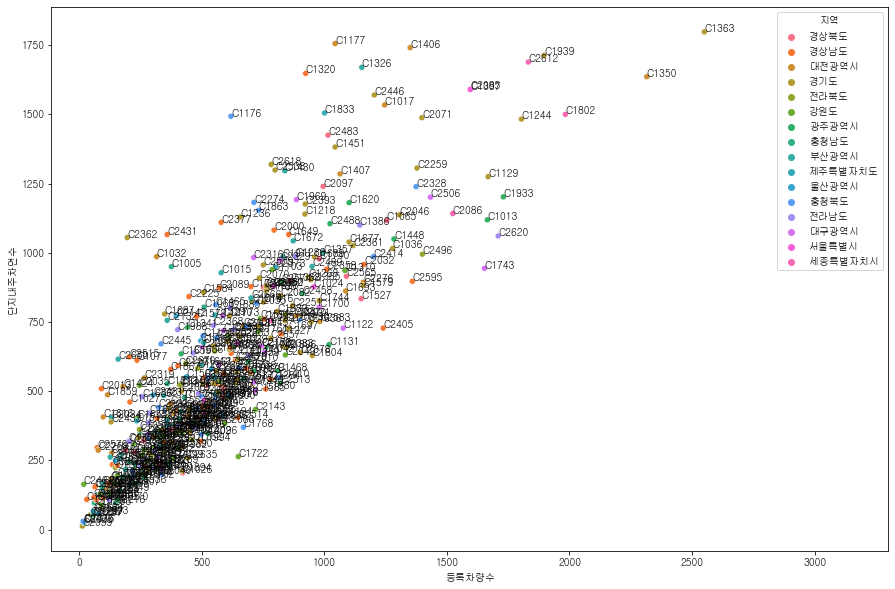

In [17]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_danji, x='등록차량수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji['단지코드']):
    plots.annotate(code, (train_danji['등록차량수'][i], train_danji['단지내주차면수'][i]))
plt.xlim(right=3300)
plt.show()

In [18]:
train_danji.loc[train_danji['단지코드'] == 'C2362']

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수
396,C2362,1509,경기도,46.0,0.0,2.0,1055.0,196.0


### 산점도(총세대수, 주차면수)

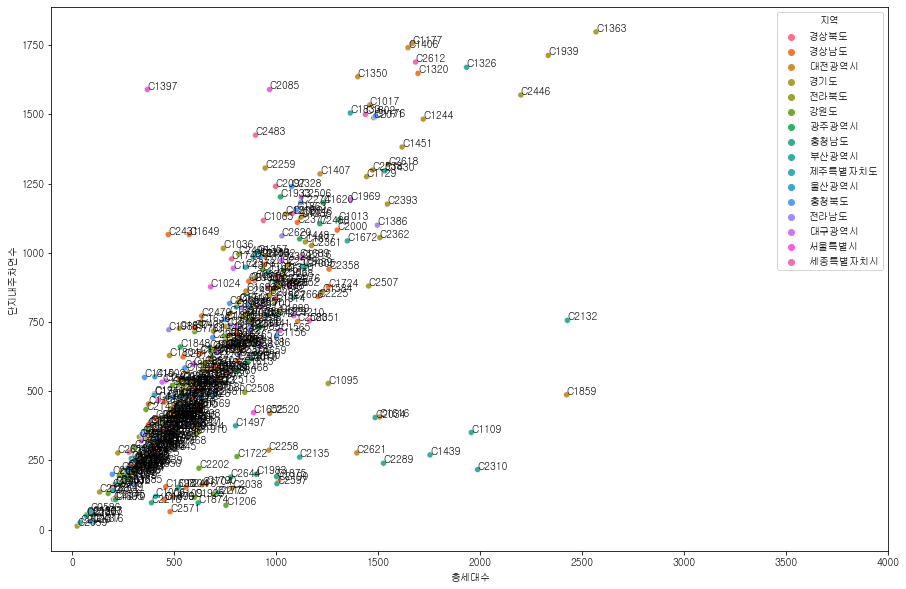

In [19]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_danji, x='총세대수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji['단지코드']):
    plots.annotate(code, (train_danji['총세대수'][i], train_danji['단지내주차면수'][i]))
plt.xlim(right=4000)
plt.show()

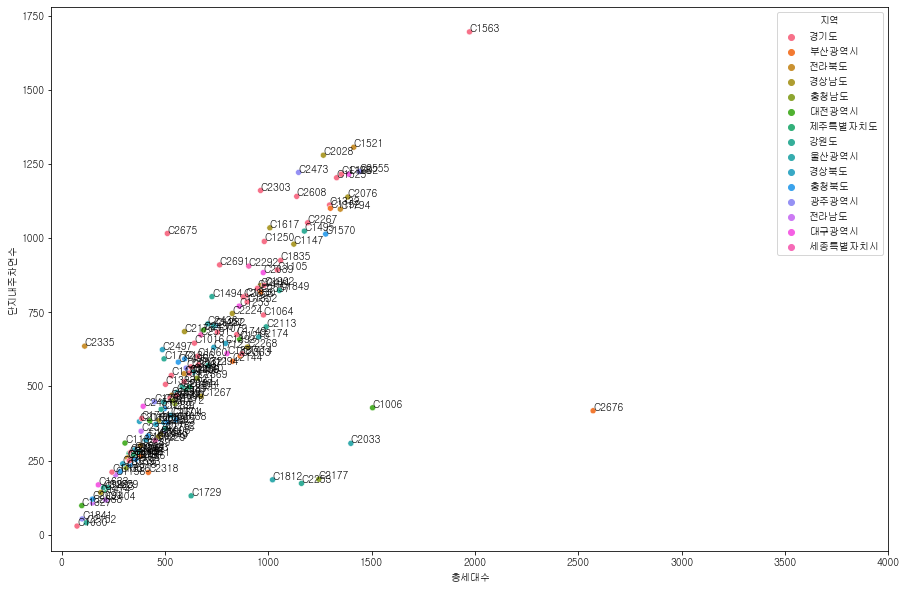

In [20]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=test_danji, x='총세대수', y='단지내주차면수', hue='지역')
for i, code in enumerate(test_danji['단지코드']):
    plots.annotate(code, (test_danji['총세대수'][i], test_danji['단지내주차면수'][i]))
plt.xlim(right=4000)
plt.show()

- 이게 말이 되나? 세대수가 100개 남짓인데 주차면수가 600개인 곳이 있고
- 세대수가 2500호가 넘는데 주차면수가 400 남짓이다? 이게 상식적으로 말이 되나?
- 법정 주차대수가 존재하기 때문에 최소한의 미니멈 주차면수가 있어야 하는데, 이게 말이 되나?

건축연면적을 따져봅시다.

### 산점도(건축연면적, 주차면수)

In [21]:
train['건축연면적'] = train['전용면적'] * train['전용면적별세대수']
test['건축연면적'] = test['전용면적'] * test['전용면적별세대수']

In [22]:
temp = train.groupby(['단지코드']).sum().reset_index()
train_size = pd.merge(train_danji, temp[['단지코드', '건축연면적']], how='inner', on='단지코드')

In [23]:
temp = test.groupby(['단지코드']).sum().reset_index()
test_size = pd.merge(test_danji, temp[['단지코드', '건축연면적']], how='inner', on='단지코드')

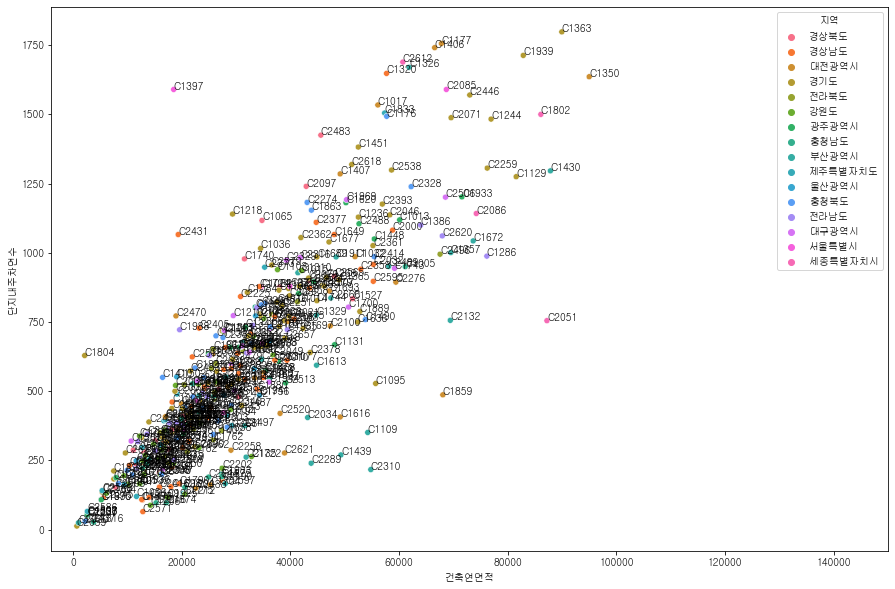

In [24]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_size, x='건축연면적', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_size['단지코드']):
    plots.annotate(code, (train_size['건축연면적'][i], train_size['단지내주차면수'][i]))
plt.xlim(right=150000)
plt.show()

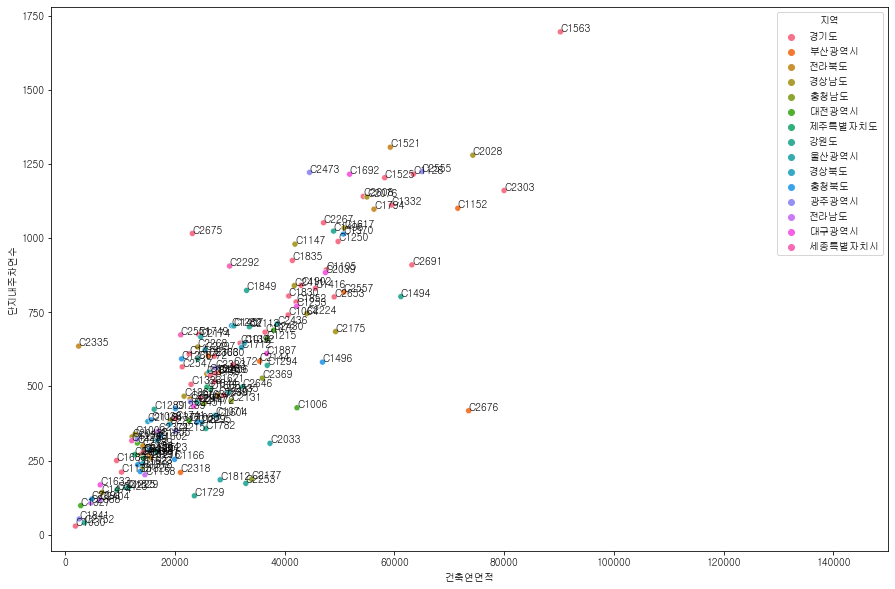

In [25]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=test_size, x='건축연면적', y='단지내주차면수', hue='지역')
for i, code in enumerate(test_size['단지코드']):
    plots.annotate(code, (test_size['건축연면적'][i], test_size['단지내주차면수'][i]))
plt.xlim(right=150000)
plt.show()

건축연면적으로 따져도 추세선을 벗어나는 단지가 몇 개 있습니다.

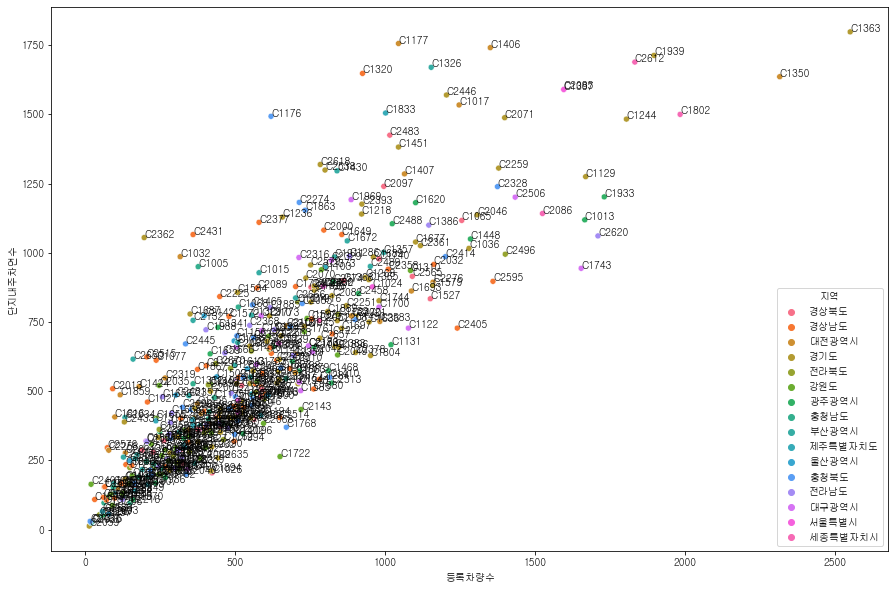

In [26]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_danji, x='등록차량수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji['단지코드']):
    plots.annotate(code, (train_danji['등록차량수'][i], train_danji['단지내주차면수'][i]))
plt.show()

### 레그플롯-지역별(총세대수, 주차면수)

지역별로 살펴봐야겠습니다. 지역별로 법정주차대수가 다르기 때문에 그래프가 다르게 나타날 수 있습니다.

In [27]:
train_danji.head()

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수
0,C2483,900,경상북도,38.0,0.0,3.0,1425.0,1015.0
1,C2515,545,경상남도,17.0,0.0,3.0,624.0,205.0
2,C1407,1216,대전광역시,13.0,1.0,1.0,1285.0,1064.0
3,C1945,755,경기도,6.0,1.0,3.0,734.0,730.0
4,C1470,696,전라북도,14.0,0.0,2.0,645.0,553.0


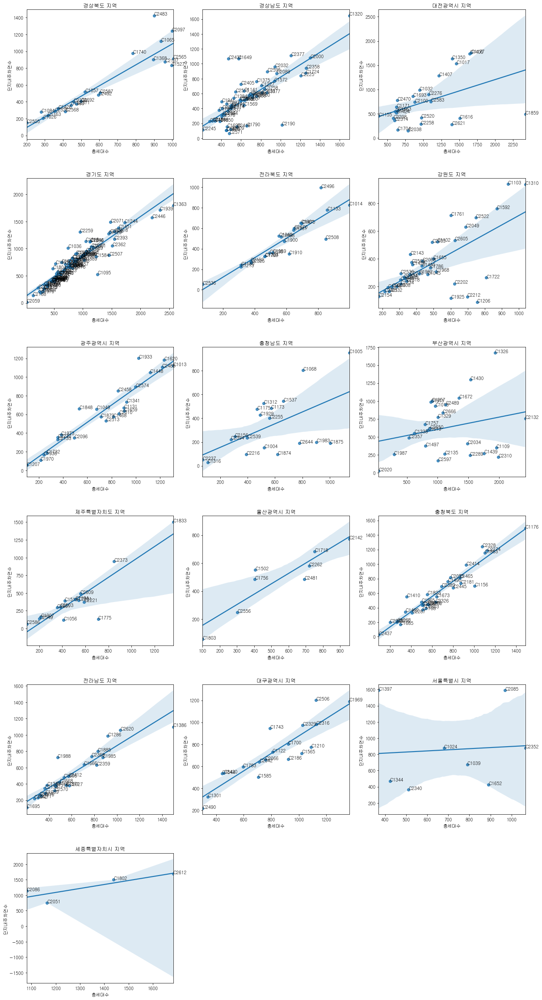

In [28]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(train_danji['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=train_danji.loc[train_danji['지역'] == n], x='총세대수', y='단지내주차면수')
    for i, code in enumerate(train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['총세대수'][i],
                              train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

- 보통은 법정주차대수 때문에 총세대수와 주차면수는 곧은 선형관계를 띄게 되어 있습니다.
- 그런데 우측 하단에 그 관계를 벗어나는 군집이 나타납니다. 대전, 강원도, 충남, 부산이 특히 그렇습니다.
- 가설은 아주 오래된 아파트이거나, 자차를 소유하지 않은 주민들이 많이 사는 지역일 가능성입니다.
- 또 특이한 지역은 서울과 세종인데, 세종은 데이터가 많지 않아서 그렇다 쳐도 서울은 그냥 중구난방입니다.
- 서울은 아마도 구별로 패턴이 많이 달라서 그런 것 같습니다.

In [29]:
train_danji.loc[train_danji['지역'] == '서울특별시']

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수
145,C2340,512,서울특별시,15.0,0.0,3.0,362.0,382.0
260,C1344,424,서울특별시,0.0,0.0,3.0,467.0,509.0
274,C1397,370,서울특별시,9.0,0.0,3.0,1590.0,1595.0
279,C2352,1065,서울특별시,7.0,0.0,4.0,879.0,793.0
282,C1039,790,서울특별시,13.0,0.0,3.0,673.0,645.0
292,C1024,680,서울특별시,2.0,0.0,3.0,877.0,957.0
297,C2085,969,서울특별시,0.0,0.0,3.0,1590.0,1595.0
380,C1652,890,서울특별시,20.0,1.0,8.0,423.0,509.0


In [30]:
train.loc[train['단지코드'] == 'C1397']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,건축연면적
2043,C1397,370,아파트,서울특별시,장기전세,23.32,51,9.0,A,87444000,-,0.0,3.0,1590.0,1595.0,1189.32
2044,C1397,370,아파트,서울특별시,장기전세,46.79,4,9.0,A,174888000,-,0.0,3.0,1590.0,1595.0,187.16
2045,C1397,370,아파트,서울특별시,장기전세,46.91,69,9.0,A,174888000,-,0.0,3.0,1590.0,1595.0,3236.79
2046,C1397,370,아파트,서울특별시,장기전세,51.96,24,9.0,A,194562000,-,0.0,3.0,1590.0,1595.0,1247.04
2047,C1397,370,아파트,서울특별시,장기전세,51.99,80,9.0,A,194562000,-,0.0,3.0,1590.0,1595.0,4159.20
2048,C1397,370,아파트,서울특별시,장기전세,59.93,142,9.0,A,216423000,-,0.0,3.0,1590.0,1595.0,8510.06


- 아무리 서울이라도 370세대에 단지내주차면수가 1590대는 심합니다. 심지어 전용면적도 85가 안됩니다. 법정주차대수로는 400대도 안됩니다.

- LH강남힐스테이트아파트. 총 1339세대가 살고 있는 대단지입니다. 이렇게 따지면 총세대수, 전용면적별세대수, 건축연면적 전부 소음입니다.
- 아니 그렇다고 저 컬럼을 버릴 수는 없어요. 그럼 버려야 할 것은 선형관계에서 벗어나는 세대들입니다.

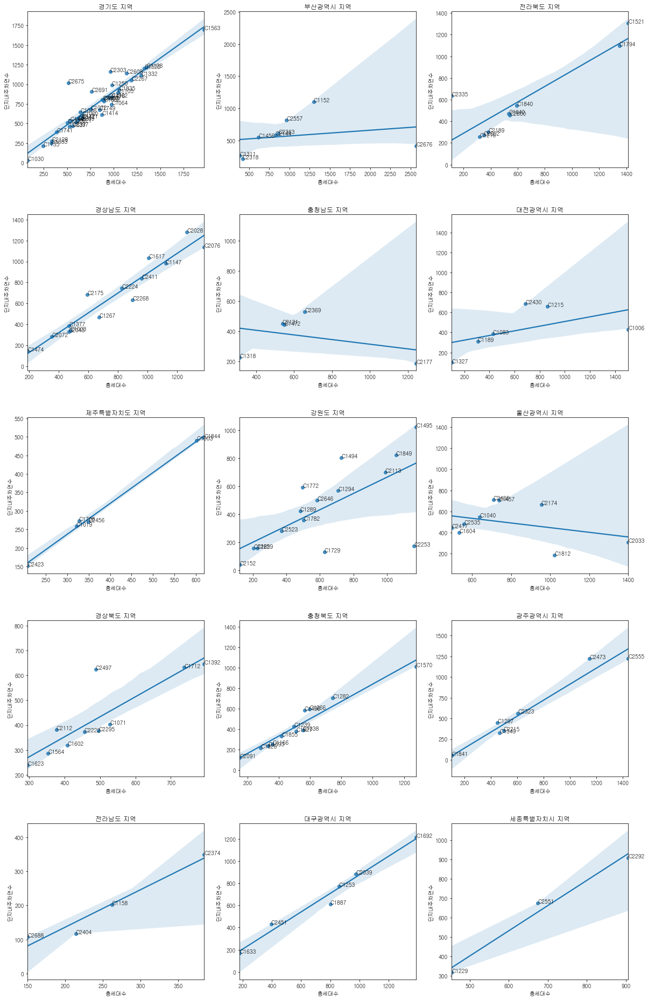

In [31]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(test_danji['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=test_danji.loc[test_danji['지역'] == n], x='총세대수', y='단지내주차면수')
    for i, code in enumerate(test_danji.loc[test_danji['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (test_danji.loc[test_danji['지역'] == n].reset_index(drop=True)['총세대수'][i],
                              test_danji.loc[test_danji['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

### 산점도-지역별(건축연면적, 주차면수)

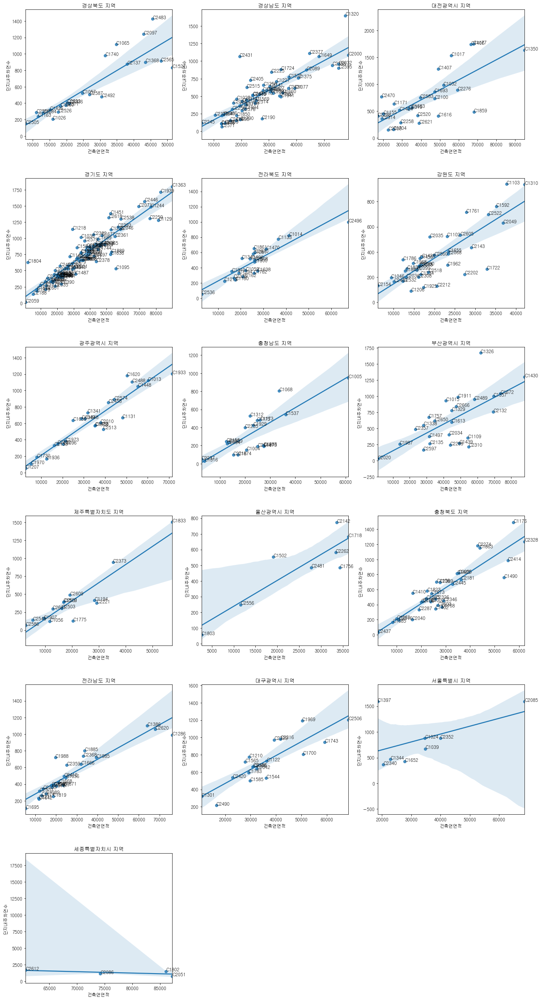

In [32]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(train_size['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=train_size.loc[train_size['지역'] == n], x='건축연면적', y='단지내주차면수')
    for i, code in enumerate(train_size.loc[train_size['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (train_size.loc[train_size['지역'] == n].reset_index(drop=True)['건축연면적'][i],
                              train_size.loc[train_size['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

- 건축연면적으로 따지면 또 서울은 아웃라이어는 1397단지 뿐이기도 합니다.

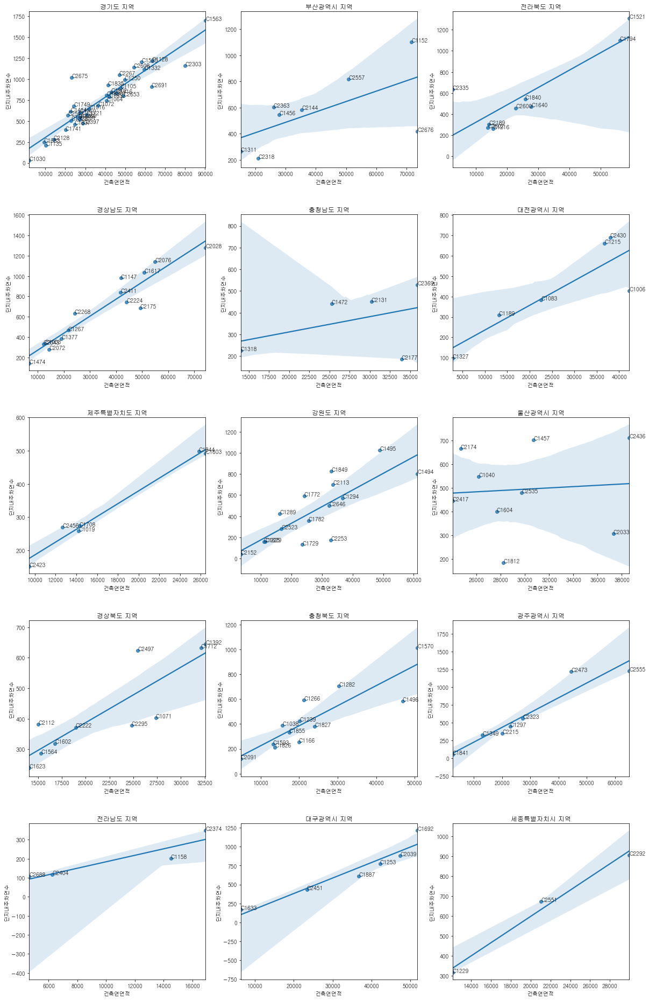

In [33]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(test_size['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=test_size.loc[test_size['지역'] == n], x='건축연면적', y='단지내주차면수')
    for i, code in enumerate(test_size.loc[test_size['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (test_size.loc[test_size['지역'] == n].reset_index(drop=True)['건축연면적'][i],
                              test_size.loc[test_size['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

근데 또 예측해야 하는 단지에 비율이 맞지 않는 단지들이 존재한다는 것이죠

### 막대차트 (총세대수주차면수비 & 건축연면적주차면수비)

In [34]:
train_size['주차면수/총세대수'] = train_size['단지내주차면수'] / train_size['총세대수']
train_size['주차면수/건축연면적'] = (train_size['단지내주차면수'] / train_size['건축연면적']) * 100

test_size['주차면수/총세대수'] = test_size['단지내주차면수'] / test_size['총세대수']
test_size['주차면수/건축연면적'] = (test_size['단지내주차면수'] / test_size['건축연면적']) * 100

In [35]:
train_size.nlargest(5, '주차면수/총세대수')

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수,건축연면적,주차면수/총세대수,주차면수/건축연면적
274,C1397,370,서울특별시,9.0,0.0,3.0,1590.0,1595.0,18529.57,4.297297,8.580879
327,C2431,472,경상남도,16.0,0.0,2.0,1066.0,359.0,19357.44,2.258475,5.506927
318,C1649,575,경상남도,15.0,0.0,7.0,1066.0,855.0,48053.20,1.853913,2.218375
297,C2085,969,서울특별시,0.0,0.0,3.0,1590.0,1595.0,68694.64,1.640867,2.314591
0,C2483,900,경상북도,38.0,0.0,3.0,1425.0,1015.0,45605.89,1.583333,3.124596


In [36]:
train_size.nsmallest(5, '주차면수/총세대수')

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수,건축연면적,주차면수/총세대수,주차면수/건축연면적
44,C2310,1988,부산광역시,1.0,0.0,2.0,217.0,189.0,54798.29,0.109155,0.395998
53,C1206,755,강원도,1.0,0.0,4.0,88.0,90.0,14243.80,0.116556,0.617813
71,C2571,481,경상남도,5.0,0.0,1.0,65.0,62.0,12849.89,0.135135,0.505841
47,C1439,1755,부산광역시,29.0,1.0,3.0,270.0,172.0,49294.74,0.153846,0.547726
16,C1874,619,충청남도,2.0,0.0,2.0,97.0,62.0,17191.41,0.156704,0.564235


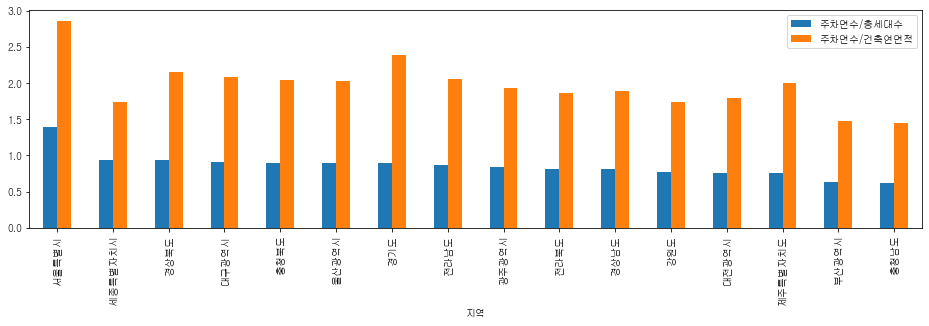

In [37]:
(train_size
 .groupby(['지역'])[['주차면수/총세대수', '주차면수/건축연면적']]
 .mean()
 .sort_values(by='주차면수/총세대수', ascending=False)
 .plot(kind='bar', figsize=(16, 4)))
plt.show()

- 두 비가 다 높은 서울시는 주어진 총세대수와 건축연면적에 비해 주차면수가 높게 형성되어 있다는 뜻입니다.
- 세종은 총세대수에 대한 주차면수는 높지만, 건축연면적에 비해서는 낮습니다.
- 보통 총세대수가 많으면 건축연면적도 높습니다. 그래서 비율이 비슷하게 가는 것이 보통입니다.
- 세종같은 경우는 총세대수에 비해 건축연면적이 높은 편이라는 뜻이고, 이는 대형평형수가 많다는 의미입니다.
- 총세대수주차면수비에 비해 건축연면적주차면수비가 높은 경기도 같은 경우는 반대라는 것입니다.

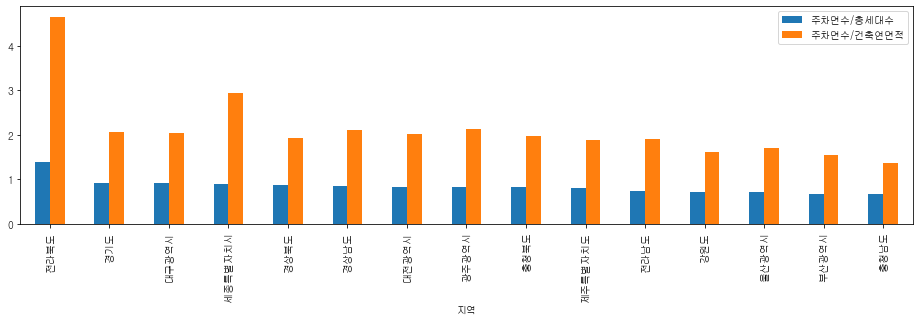

In [38]:
(test_size
 .groupby(['지역'])[['주차면수/총세대수', '주차면수/건축연면적']]
 .mean()
 .sort_values(by='주차면수/총세대수', ascending=False)
 .plot(kind='bar', figsize=(16, 4)))
plt.show()

- 근데 또 테스트 데이터에서는 반대로 나타납니다. 세종의 건축연면적주차면수비가 높게 형성됩니다. 그리고 경기도는 오히려 낮게 나타나죠.
- 정말 뒤죽박죽 데이터입니다.

In [39]:
train_size['등록차량수/총세대수'] = train_size['등록차량수'] / train_size['총세대수']
train_size['등록차량수/건축연면적'] = (train_size['등록차량수'] / train_size['건축연면적']) * 50
train_size['등록차량수/주차면수'] = train_size['등록차량수'] / train_size['단지내주차면수']

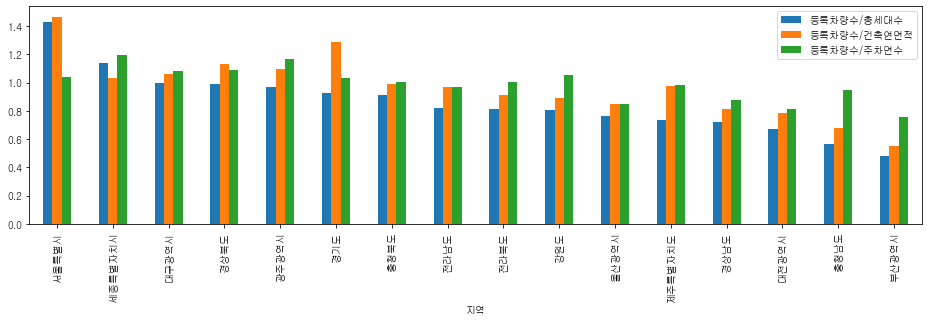

In [40]:
(train_size
 .groupby(['지역'])[['등록차량수/총세대수', '등록차량수/건축연면적', '등록차량수/주차면수']]
 .mean()
 .sort_values(by='등록차량수/총세대수', ascending=False)
 .plot(kind='bar', figsize=(16, 4)))
plt.show()

### 공급유형 바차트

공급유형을 살펴봐야겠습니다.

In [41]:
train_reqruit = pd.pivot_table(train, index='단지코드', columns='공급유형', values='전용면적별세대수', aggfunc=np.sum, fill_value=0)
train_reqruit.head()

공급유형,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택
단지코드,,,,,,,,,,
C1000,0,0,0,0,0,566,0,0,0,0
C1004,0,0,0,0,0,0,504,17,0,0
C1005,0,0,0,0,0,1144,0,0,0,0
C1013,0,0,0,0,0,1308,0,0,0,0
C1014,0,0,0,0,0,996,0,0,0,0


In [42]:
train_reqruit2 = pd.merge(train_reqruit.reset_index(), train[['단지코드', '지역', '단지내주차면수']],
                          how='inner', on='단지코드').drop_duplicates().set_index('단지코드')

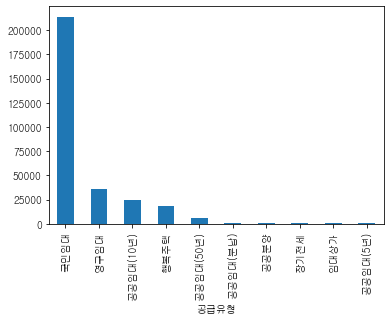

In [43]:
train_reqruit.sum(axis=0).sort_values(ascending=False).plot(kind='bar')
plt.show()

- 국민임대가 20만호가 넘으며 압도적인 비중입니다. 그 뒤로 영구임대, 공공임대, 행복주택 등이 있습니다.

In [44]:
test['공급유형'].unique()

array(['국민임대', '영구임대', '임대상가', '공공임대(50년)', '공공임대(10년)', '공공임대(분납)',
       '행복주택'], dtype=object)

In [45]:
train_reqruit2.nlargest(5, '공공분양')

,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택,지역,단지내주차면수
단지코드,,,,,,,,,,,,
C1350,711,342,0,0,348,0,0,0,0,0,대전광역시,1636.0
C1000,0,0,0,0,0,566,0,0,0,0,충청북도,438.0
C1004,0,0,0,0,0,0,504,17,0,0,충청남도,153.0
C1005,0,0,0,0,0,1144,0,0,0,0,충청남도,950.0
C1013,0,0,0,0,0,1308,0,0,0,0,광주광역시,1119.0


In [46]:
train_reqruit2.nlargest(10, '공공임대(10년)')

,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택,지역,단지내주차면수
단지코드,,,,,,,,,,,,
C1129,0,1444,0,0,0,0,0,0,0,0,경기도,1275.0
C1802,0,1438,0,0,0,0,0,0,0,0,세종특별자치시,1500.0
C2051,0,1164,0,0,0,0,0,0,0,0,세종특별자치시,755.0
C2506,0,1124,0,0,0,0,0,0,0,0,대구광역시,1201.0
C2086,0,1080,0,0,0,0,0,0,0,0,세종특별자치시,1142.0
C2328,0,1077,0,0,0,0,0,0,0,0,충청북도,1239.0
C1933,0,1022,0,0,0,0,0,0,0,0,광주광역시,1202.0
C2259,0,947,0,0,0,0,0,0,0,0,경기도,1306.0
C2414,0,924,0,0,0,0,0,0,0,0,충청북도,986.0


In [47]:
train_reqruit2.nlargest(10, '공공임대(5년)')

,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택,지역,단지내주차면수
단지코드,,,,,,,,,,,,
C2470,0,0,0,406,0,0,0,0,0,0,대전광역시,772.0
C1000,0,0,0,0,0,566,0,0,0,0,충청북도,438.0
C1004,0,0,0,0,0,0,504,17,0,0,충청남도,153.0
C1005,0,0,0,0,0,1144,0,0,0,0,충청남도,950.0
C1013,0,0,0,0,0,1308,0,0,0,0,광주광역시,1119.0
C1014,0,0,0,0,0,996,0,0,0,0,전라북도,823.0
C1015,0,0,0,0,0,961,0,0,0,0,부산광역시,928.0
C1017,0,0,0,0,0,1460,0,0,0,0,대전광역시,1534.0
C1022,0,0,0,0,0,389,0,0,0,0,경기도,352.0


In [48]:
train_reqruit2.nlargest(10, '공공임대(50년)')

,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택,지역,단지내주차면수
단지코드,,,,,,,,,,,,
C2520,0,0,960,0,0,0,0,0,0,0,대전광역시,420.0
C1497,0,0,802,0,0,0,0,0,0,0,부산광역시,375.0
C1424,0,0,624,0,0,0,0,0,0,0,대전광역시,517.0
C2202,0,0,623,0,0,0,0,0,0,0,강원도,222.0
C2221,0,0,590,0,0,0,0,0,0,0,제주특별자치도,376.0
C2340,0,0,512,0,0,0,0,0,0,0,서울특별시,362.0
C1722,0,0,505,0,0,0,298,6,0,0,강원도,264.0
C2216,0,0,390,0,0,0,0,0,0,0,충청남도,97.0
C2644,0,0,387,0,0,0,388,3,0,0,충청남도,190.0


In [49]:
req_cols = ['공공분양', '공공임대(10년)', '공공임대(50년)', '공공임대(5년)', '공공임대(분납)',
       '영구임대', '임대상가', '장기전세', '행복주택']

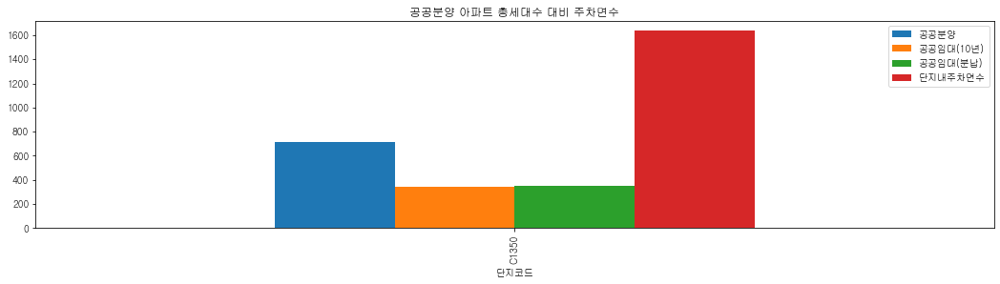

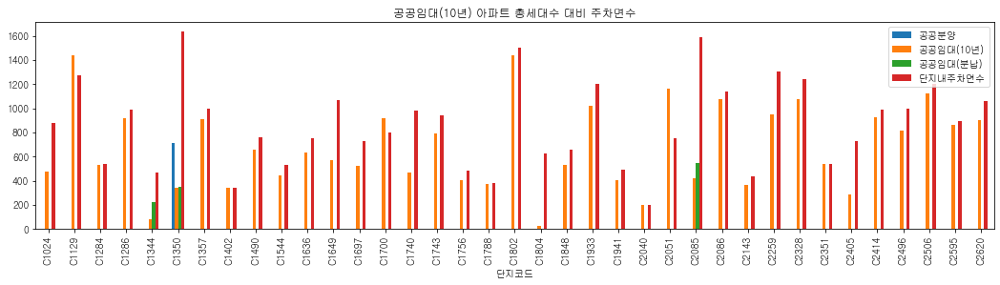

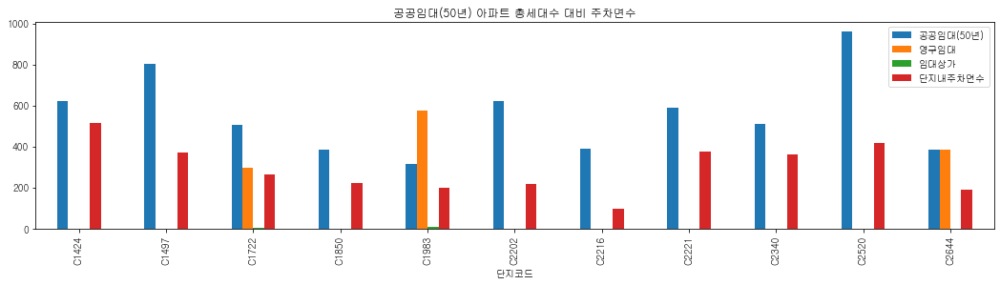

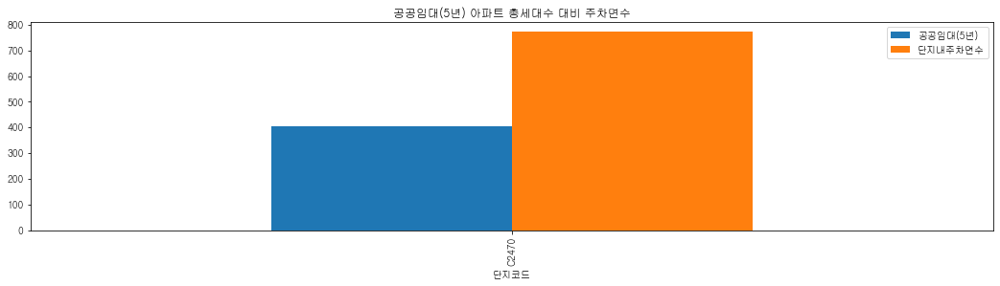

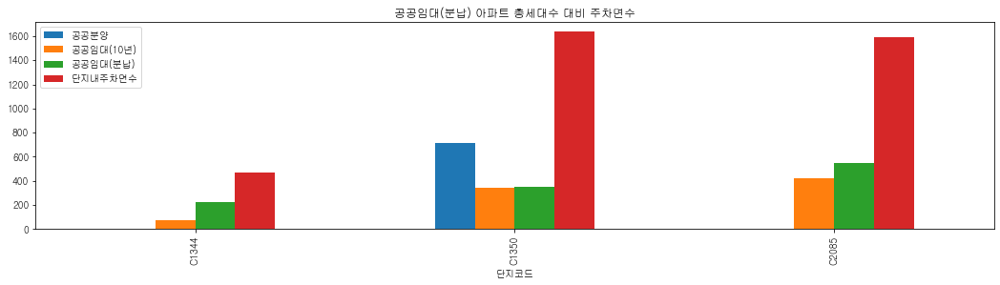

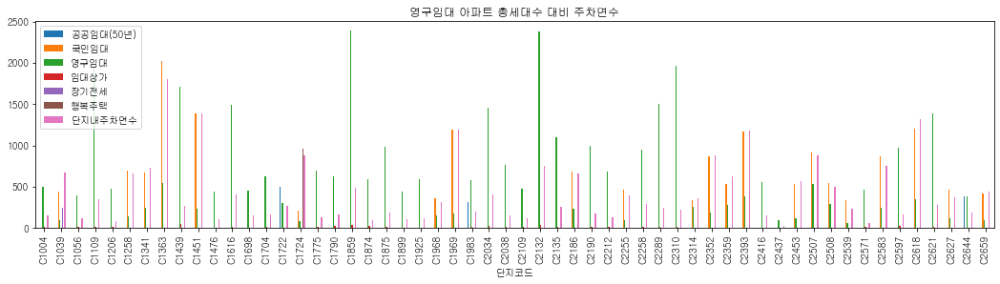

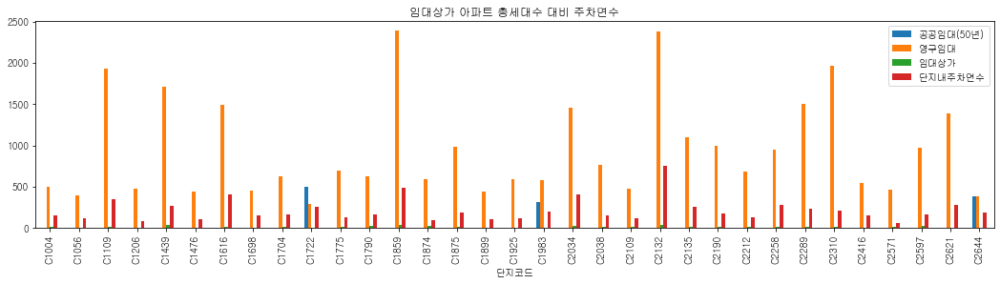

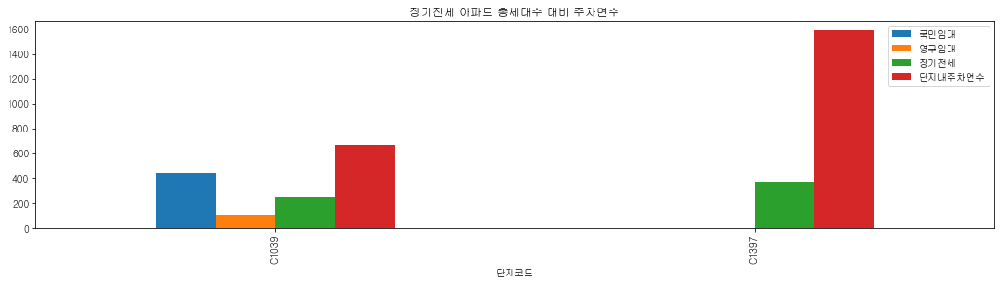

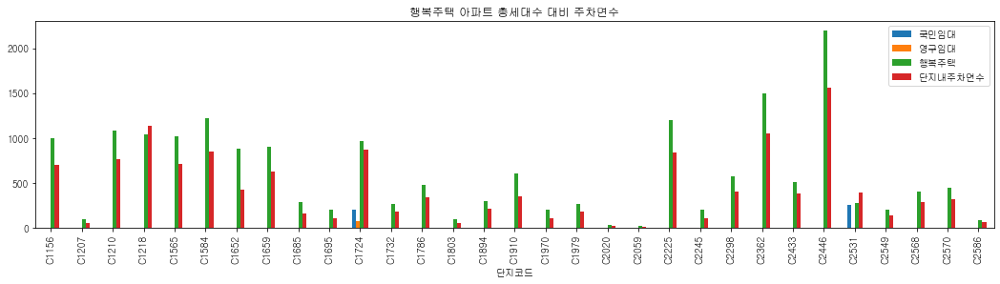

In [50]:
for col in req_cols:
    train_reqruit2.loc[train_reqruit2[col] != 0,
                      [x for x in train_reqruit2.columns if train_reqruit2.loc[train_reqruit2[col] != 0][x].sum() != 0]].plot(kind='bar', figsize=(18, 4))
    plt.title('{} 아파트 총세대수 대비 주차면수'.format(col))
    plt.show()

- 특이한 점이 많습니다.
1. 임대상가가 있는 아파트는 무조건 영구임대단지다. 총세대수에 비해 주차면수도 굉장히 적다.
2. 공공임대(50년)이 있는 단지는 주차면수가 총세대수에 비해 굉장히 적다.
3. 행복주택은 보통 행복주택만 있습니다.
4. 공공분양, 공공임대(5년), 장기전세는 단지가 너무 없습니다.

In [51]:
train_reqruit2.nlargest(10, '임대상가')

,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택,지역,단지내주차면수
단지코드,,,,,,,,,,,,
C1439,0,0,0,0,0,0,1710,45,0,0,부산광역시,270.0
C2132,0,0,0,0,0,0,2385,43,0,0,부산광역시,756.0
C1859,0,0,0,0,0,0,2389,35,0,0,대전광역시,487.0
C1790,0,0,0,0,0,0,627,30,0,0,경상남도,166.0
C2597,0,0,0,0,0,0,976,29,0,0,부산광역시,166.0
C1874,0,0,0,0,0,0,592,27,0,0,충청남도,97.0
C2034,0,0,0,0,0,0,1460,26,0,0,부산광역시,405.0
C1109,0,0,0,0,0,0,1937,20,0,0,부산광역시,351.0
C2289,0,0,0,0,0,0,1507,20,0,0,부산광역시,240.0


### 자격유형 바차트

In [52]:
train_qual = pd.pivot_table(train, index='단지코드', columns='자격유형', values='전용면적별세대수', aggfunc=np.sum, fill_value=0)
train_qual.head()

자격유형,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O
단지코드,,,,,,,,,,,,,,,
C1000,566,0,0,0,0,0,0,0,0,0,0,0,0,0,0
C1004,0,0,504,17,0,0,0,0,0,0,0,0,0,0,0
C1005,1144,0,0,0,0,0,0,0,0,0,0,0,0,0,0
C1013,1308,0,0,0,0,0,0,0,0,0,0,0,0,0,0
C1014,996,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [53]:
train_qual2 = pd.merge(train_qual.reset_index(),
                       train[['단지코드', '지역', '단지내주차면수']],
                       how='inner', on='단지코드').drop_duplicates().set_index('단지코드')

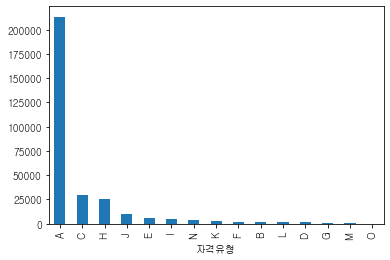

In [54]:
train_qual.sum(axis=0).sort_values(ascending=False).plot(kind='bar')
plt.show()

- A가 압도적으로 많습니다. C, H가 뒤를 잇습니다.

In [55]:
qual_cols = ['C', 'D', 'E', 'H', 'I', 'J', 'K', 'L']
qual_cols2 = ['M', 'N', 'O', 'F', 'B', 'G']

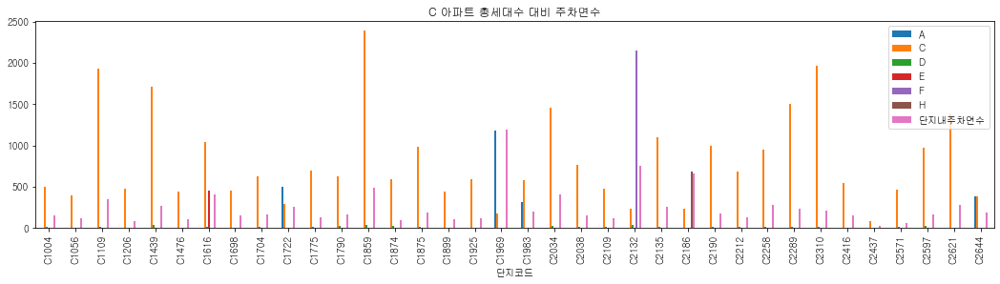

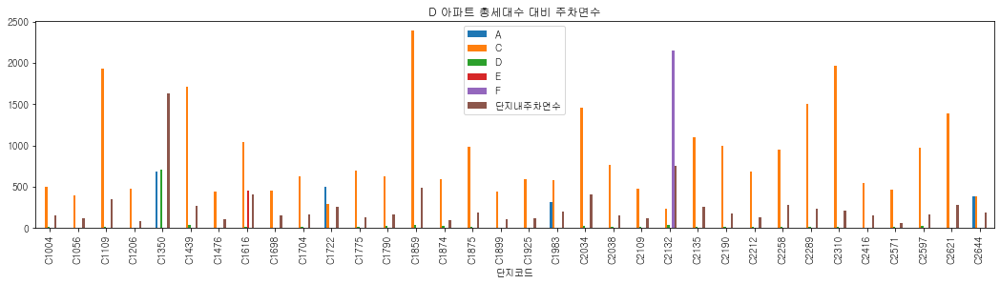

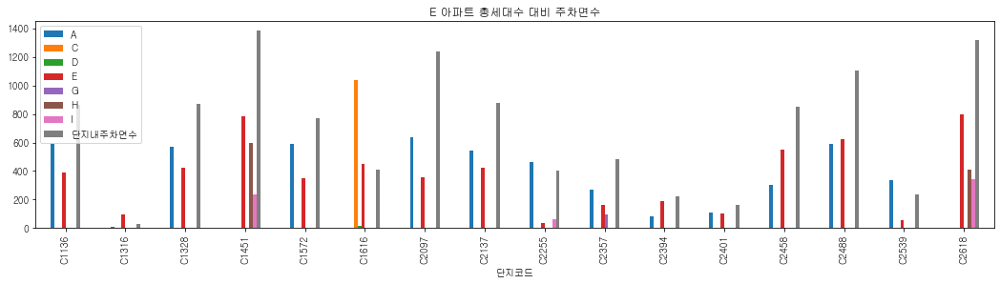

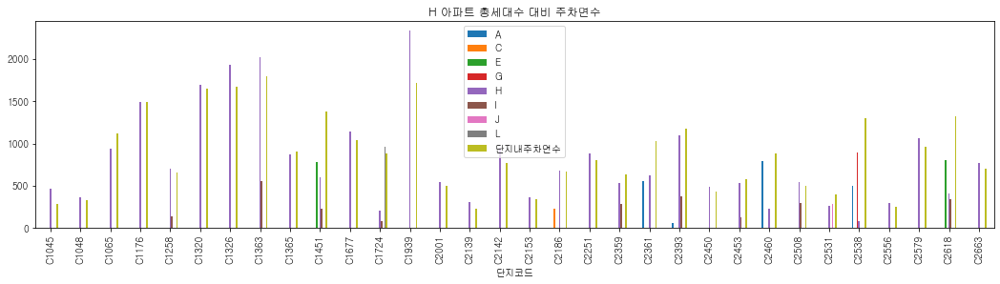

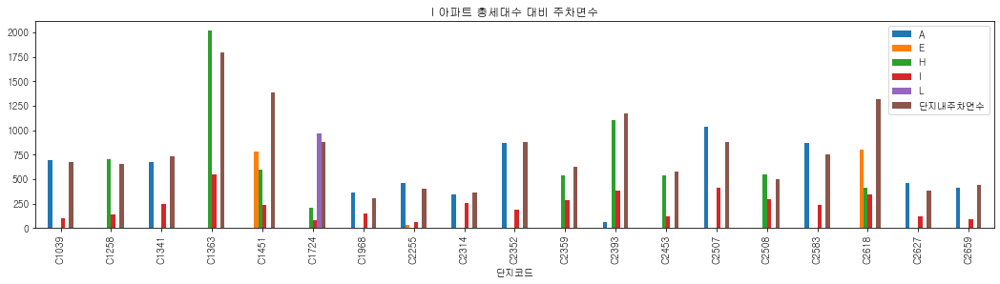

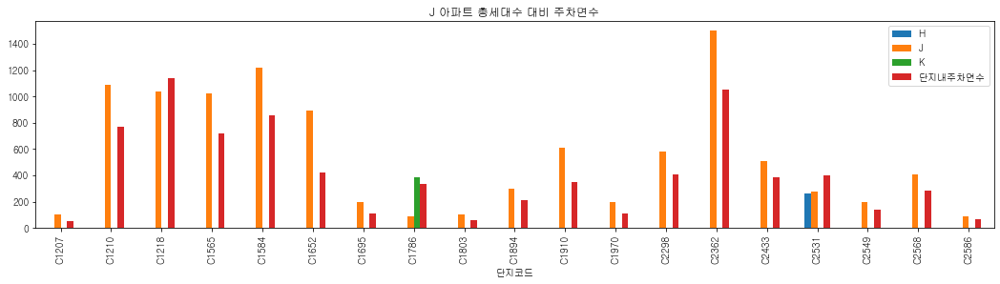

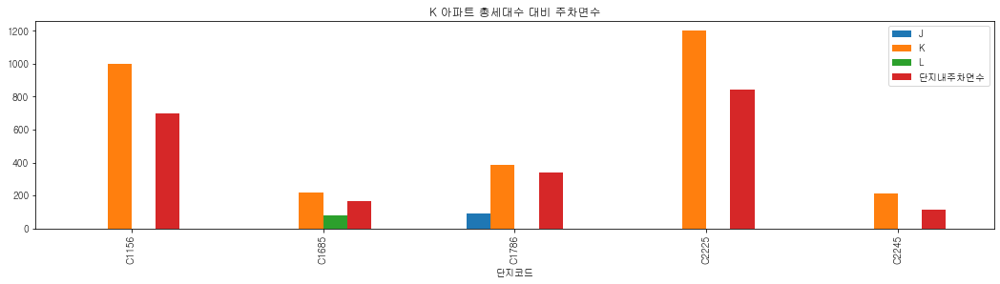

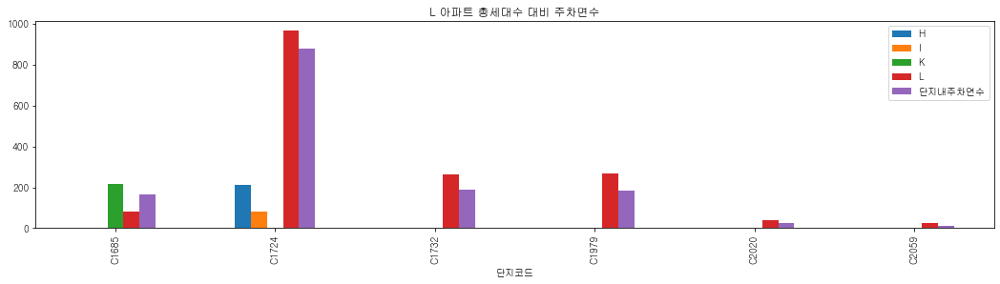

In [56]:
for col in qual_cols:
    train_qual2.loc[train_qual2[col] != 0,
                      [x for x in train_qual2.columns if train_qual2.loc[train_qual2[col] != 0][x].sum() != 0]].plot(kind='bar', figsize=(18, 4))
    plt.title('{} 아파트 총세대수 대비 주차면수'.format(col))
    plt.show()

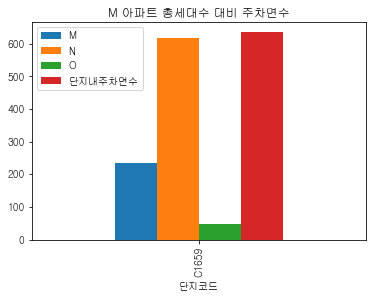

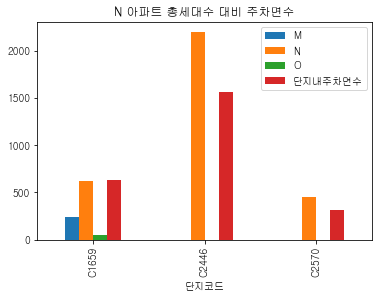

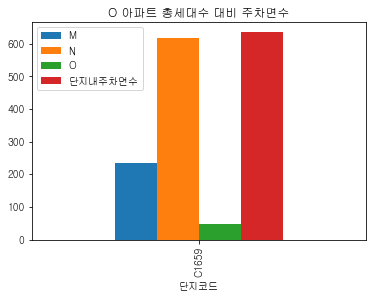

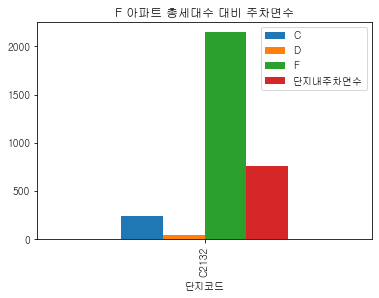

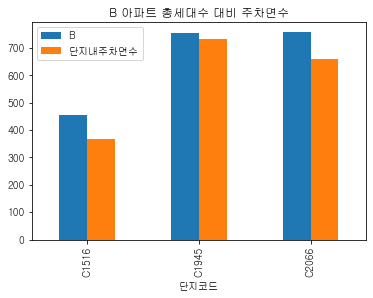

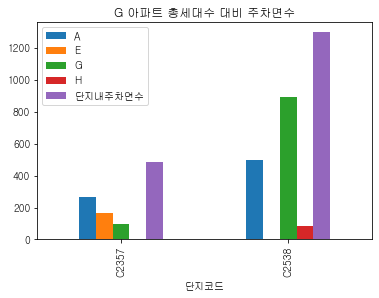

In [57]:
for col in qual_cols2:
    train_qual2.loc[train_qual2[col] != 0,
                      [x for x in train_qual2.columns if train_qual2.loc[train_qual2[col] != 0][x].sum() != 0]].plot(kind='bar', figsize=(6, 4))
    plt.title('{} 아파트 총세대수 대비 주차면수'.format(col))
    plt.show()

In [58]:
train_req_qual = pd.merge(train_qual, train_reqruit2.reset_index(), how='inner', on='단지코드').drop_duplicates().set_index('단지코드')
train_req_qual.head()

,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택,지역,단지내주차면수
단지코드,,,,,,,,,,,,,,,,,,,,,,,,,,,
C1000,566,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,566,0,0,0,0,충청북도,438.0
C1004,0,0,504,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,504,17,0,0,충청남도,153.0
C1005,1144,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1144,0,0,0,0,충청남도,950.0
C1013,1308,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1308,0,0,0,0,광주광역시,1119.0
C1014,996,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,996,0,0,0,0,전라북도,823.0


In [59]:
for col in req_cols:
    print(col)
    print(tabulate(train_req_qual.loc[train_req_qual[col] != 0,
                                      [x for x in train_req_qual.columns if train_req_qual.loc[train_req_qual[col] != 0][x].sum() != 0]],
                  headers='keys', tablefmt='psql'))
    print("")

공공분양
+------------+-----+-----+------------+------------------+------------------+------------+------------------+
| 단지코드   |   A |   D |   공공분양 |   공공임대(10년) |   공공임대(분납) | 지역       |   단지내주차면수 |
|------------+-----+-----+------------+------------------+------------------+------------+------------------|
| C1350      | 690 | 711 |        711 |              342 |              348 | 대전광역시 |             1636 |
+------------+-----+-----+------------+------------------+------------------+------------+------------------+

공공임대(10년)
+------------+------+-----+------------+------------------+------------------+----------------+------------------+
| 단지코드   |    A |   D |   공공분양 |   공공임대(10년) |   공공임대(분납) | 지역           |   단지내주차면수 |
|------------+------+-----+------------+------------------+------------------+----------------+------------------|
| C1024      |  477 |   0 |          0 |              477 |                0 | 서울특별시     |              877 |
| C1129      | 1444 |   0 |          0 |

In [60]:
for col in ['B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O']:
    print(col)
    print(tabulate(train_req_qual.loc[train_req_qual[col] != 0,
                                      [x for x in train_req_qual.columns if train_req_qual.loc[train_req_qual[col] != 0][x].sum() != 0]],
                  headers='keys', tablefmt='psql'))
    print("")

B
+------------+-----+------------+------------+------------------+
| 단지코드   |   B |   국민임대 | 지역       |   단지내주차면수 |
|------------+-----+------------+------------+------------------|
| C1516      | 456 |        456 | 전라남도   |              367 |
| C1945      | 755 |        755 | 경기도     |              734 |
| C2066      | 757 |        757 | 대구광역시 |              660 |
+------------+-----+------------+------------+------------------+

C
+------------+------+------+-----+-----+------+-----+------------------+------------+------------+------------+----------------+------------------+
| 단지코드   |    A |    C |   D |   E |    F |   H |   공공임대(50년) |   국민임대 |   영구임대 |   임대상가 | 지역           |   단지내주차면수 |
|------------+------+------+-----+-----+------+-----+------------------+------------+------------+------------+----------------+------------------|
| C1004      |    0 |  504 |  17 |   0 |    0 |   0 |                0 |          0 |        504 |         17 | 충청남도       |              153 |
| C1

In [61]:
train

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,건축연면적
0,C2483,900,아파트,경상북도,국민임대,39.72,134,38.0,A,15667000,103680,0.0,3.0,1425.0,1015.0,5322.48
1,C2483,900,아파트,경상북도,국민임대,39.72,15,38.0,A,15667000,103680,0.0,3.0,1425.0,1015.0,595.80
2,C2483,900,아파트,경상북도,국민임대,51.93,385,38.0,A,27304000,184330,0.0,3.0,1425.0,1015.0,19993.05
3,C2483,900,아파트,경상북도,국민임대,51.93,15,38.0,A,27304000,184330,0.0,3.0,1425.0,1015.0,778.95
4,C2483,900,아파트,경상북도,국민임대,51.93,41,38.0,A,27304000,184330,0.0,3.0,1425.0,1015.0,2129.13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2947,C2532,239,아파트,강원도,국민임대,49.20,19,7.0,A,11346000,116090,0.0,1.0,166.0,146.0,934.80
2948,C2532,239,아파트,강원도,국민임대,51.08,34,7.0,A,14005000,142310,0.0,1.0,166.0,146.0,1736.72
2949,C2532,239,아파트,강원도,국민임대,51.73,34,7.0,A,14005000,142310,0.0,1.0,166.0,146.0,1758.82
2950,C2532,239,아파트,강원도,국민임대,51.96,114,7.0,A,14005000,142310,0.0,1.0,166.0,146.0,5923.44


### 지역별로, 자격유형별 평균 임대료를 살펴봐야겠습니다.

### Deposit / Rent Preprocessing

In [64]:
# '-' 값을 0으로 만들어줍니다.
train.loc[train['임대보증금'] == '-', '임대보증금'] = 0
test.loc[test['임대보증금'] == '-', '임대보증금'] = 0

train.loc[train['임대료'] == '-', '임대료'] = 0
test.loc[test['임대료'] == '-', '임대료'] = 0

In [65]:
# nan 값 때문에 object로 되어 있습니다. 일단 0으로 채워 줍니다.
train['임대보증금'] = train['임대보증금'].fillna(0)
test['임대보증금'] = test['임대보증금'].fillna(0)

train['임대료'] = train['임대료'].fillna(0)
test['임대료'] = test['임대료'].fillna(0)

In [66]:
# 계산을 위해서 int로 바꿔줍니다.
train['임대보증금'] = train['임대보증금'].astype(int)
test['임대보증금'] = test['임대보증금'].astype(int)

train['임대료'] = train['임대료'].astype(int)
test['임대료'] = test['임대료'].astype(int)

In [67]:
# 면적당으로 보증금과 임대료를 산출해서 역으로 채워넣겠습니다.
train['면적당보증금'] = train['임대보증금'] / train['전용면적']
train['면적당임대료'] = train['임대료'] / train['전용면적']

test['면적당보증금'] = test['임대보증금'] / test['전용면적']
test['면적당임대료'] = test['임대료'] / test['전용면적']

In [68]:
# 0 값을 다시 NULL 값으로 바꿉니다.
train.loc[(train['면적당보증금'] == 0), ['임대보증금', '면적당보증금']] = np.nan
train.loc[(train['면적당임대료'] == 0), ['임대료', '면적당임대료']] = np.nan

test.loc[(test['면적당보증금'] == 0), ['임대보증금', '면적당보증금']] = np.nan
test.loc[(test['면적당임대료'] == 0), ['임대료', '면적당임대료']] = np.nan

In [69]:
mean_rent = train.groupby(['지역', '자격유형'])[['면적당임대료']].mean().reset_index()

In [70]:
mean_rent = mean_rent.loc[mean_rent['면적당임대료'] != 0]

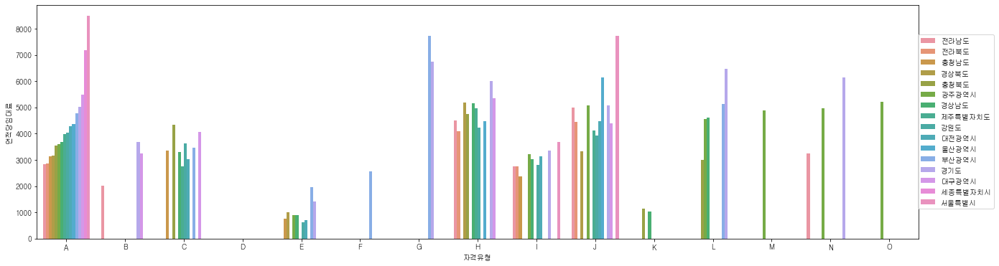

In [71]:
plt.figure(figsize=(22, 6))
sns.barplot(data=mean_rent.sort_values(by=['자격유형', '면적당임대료']),
            x='자격유형', y='면적당임대료', hue='지역')
plt.legend(loc='right', bbox_to_anchor=(1.09, 0.5))
plt.show()

- A, J, G 는 꽤나 높게 형성됩니다.
- 그러나 E, K 는 꽤나 낮게 형성됩니다.

In [72]:
kookmin_A = (
    train
    .loc[(train['공급유형'] == '국민임대') & (train['자격유형'] == 'A')]
    .groupby(['지역'])['면적당임대료']
    .mean()
    .sort_values(ascending=False)
    .to_frame()
)
kookmin_A

,면적당임대료
지역,
서울특별시,7487.593573
세종특별자치시,5321.380731
경기도,4858.148493
부산광역시,4641.213217
대구광역시,4272.213051
대전광역시,4084.761630
강원도,3940.679162
제주특별자치도,3787.516145
울산광역시,3574.029464


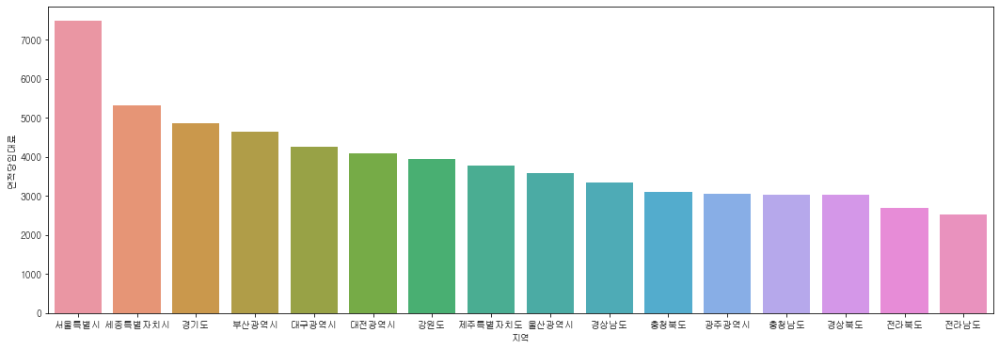

In [73]:
plt.figure(figsize=(18, 6))
sns.barplot(data=kookmin_A, x=kookmin_A.index, y='면적당임대료')
plt.show()

- 국민임대일반지수를 만들어줄 수도 있을 것 같습니다. 표준화를 통해서..
- 지역별 국민임대, A 의 평균 면적당 임대료를 수치로 넣어주면, 해당 지역의 보통의 지가의 수치를 대변할 수 있을 것도 같습니다.
- 문제는 강원도가 상당히 높은 게 이상합니다.

In [74]:
mean_ = kookmin_A['면적당임대료'].mean()
std_ = kookmin_A['면적당임대료'].std()
kookmin_A['국민임대일반지수'] = (kookmin_A['면적당임대료'] - mean_) / std_

In [75]:
kookmin_A

,면적당임대료,국민임대일반지수
지역,,
서울특별시,7487.593573,2.870804
세종특별자치시,5321.380731,1.126179
경기도,4858.148493,0.753100
부산광역시,4641.213217,0.578385
대구광역시,4272.213051,0.281199
대전광역시,4084.761630,0.130230
강원도,3940.679162,0.014189
제주특별자치도,3787.516145,-0.109166
울산광역시,3574.029464,-0.281104


In [76]:
mean_rent = train.groupby(['지역', '자격유형'])[['면적당임대료']].mean().reset_index()

In [77]:
# 자격유형이 존재하지 않는 지역이 있는데, 0 으로 동일하게 넣어주겠습니다. 원활한 시각화를 위해.
for region in list(mean_rent['지역'].unique()):
    for qual in list(mean_rent['자격유형'].unique()):
        if len(mean_rent.loc[(mean_rent['지역'] == region) & (mean_rent['자격유형'] == qual)]) == 0:
            mean_rent = mean_rent.append({'지역': region, '자격유형': qual, '면적당임대료': 0}, ignore_index=True)
        else:
            pass

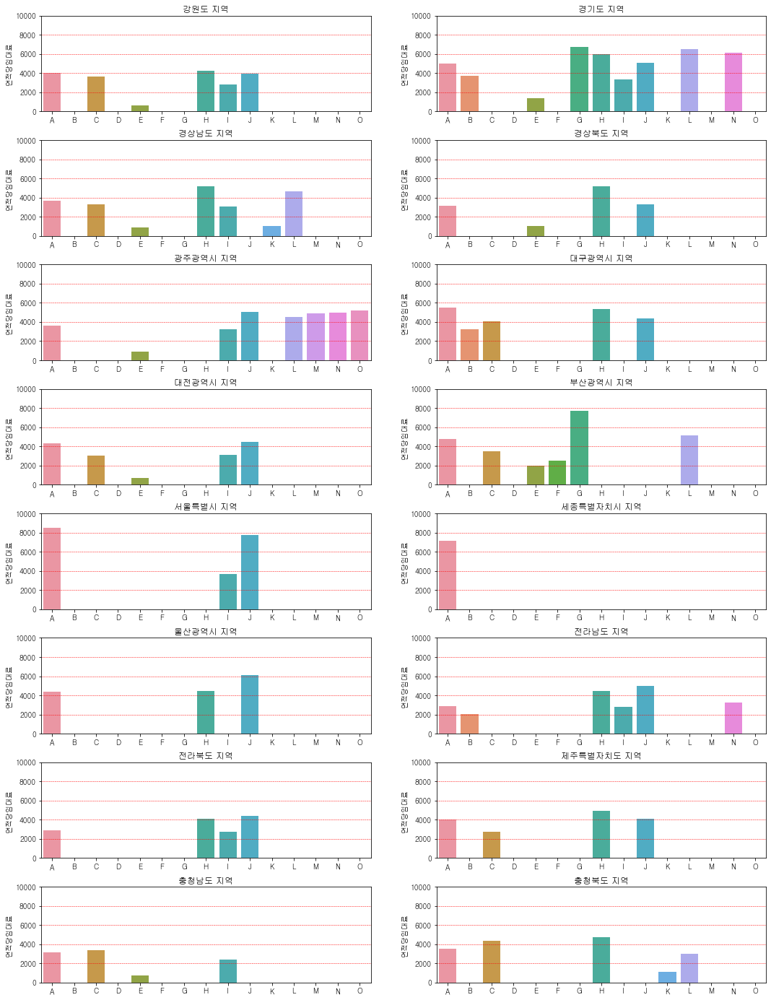

In [78]:
# 지역별로 임대료를 자격유형을 기준, 상대적으로 살펴보기 위함입니다.

fig = plt.figure(figsize=(18, 50))
for i, n in enumerate(list(mean_rent['지역'].unique())):
    plt.subplot(16, 2, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.barplot(data=mean_rent.loc[mean_rent['지역'] == n].sort_values('자격유형'), x='자격유형', y='면적당임대료')
    plt.ylim(top = 10000)
    plt.axhline(y = 2000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.axhline(y = 4000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.axhline(y = 6000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.axhline(y = 8000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.xlabel('')
    plt.title('{} 지역'.format(n))

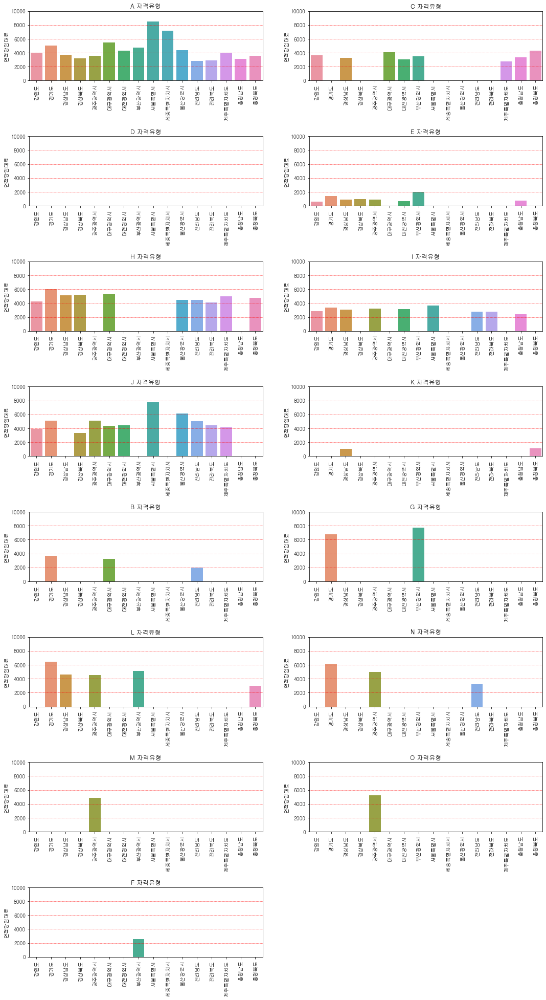

In [79]:
# 지역별로 임대료를 자격유형을 기준, 상대적으로 살펴보기 위함입니다.

fig = plt.figure(figsize=(18, 70))
for i, n in enumerate(list(mean_rent['자격유형'].unique())):
    plt.subplot(16, 2, i+1)
    plt.subplots_adjust(hspace=0.8)
    plots = sns.barplot(data=mean_rent.loc[mean_rent['자격유형'] == n].sort_values('지역'),
                        x='지역', y='면적당임대료')
    plt.ylim(top = 10000)
    plt.axhline(y = 2000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.axhline(y = 4000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.axhline(y = 6000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.axhline(y = 8000, color = 'r', linestyle = '--', linewidth = 0.5)
    plt.xlabel('')
    plt.xticks(rotation=90)
    plt.title('{} 자격유형'.format(n))

- E, K 는 도대체 무엇이길래 모든 지역에서 낮게 형성되는가?
- I도 상대적으로 낮다. 왜 그럴까?

- 확실히 보면, 자격유형이 임대료에 상당히 많은 영향을 미치며, 공급유형이 대체로 자격유형과 연관이 있습니다.
- 동일 단지라고 해서 임대료가 비슷하지가 않습니다.
- 차라리 해당 자격유형의 임대료를 평균으로 산정하고, 국민임대일반지수를 곱해주는 것이 더 나을 수도 있을 것 같습니다.

### 단지의 총 환산보증금이 단지의 특성을 대변할 수 있을까?

In [81]:
train['환산보증금'] = train['임대료'] * 354 + train['임대보증금']
test['환산보증금'] = test['임대료'] * 354 + test['임대보증금']

In [82]:
train['세대수X환산보증금'] = train['전용면적별세대수'] * train['환산보증금']
test['세대수X환산보증금'] = test['전용면적별세대수'] * test['환산보증금']

In [84]:
train_depot = pd.merge(train_danji, train.groupby(['단지코드'])['세대수X환산보증금'].sum().reset_index(),
                       how='inner', on='단지코드')

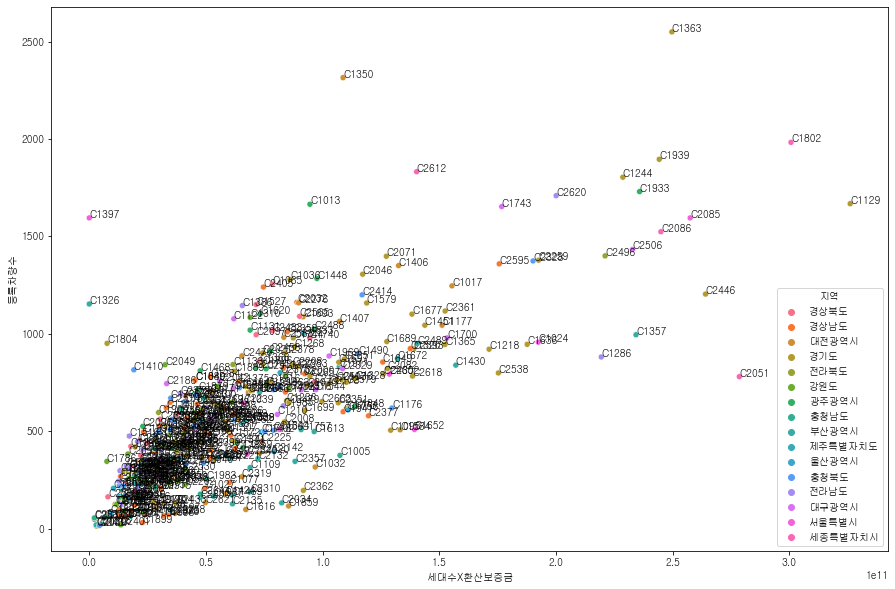

In [85]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_depot, x='세대수X환산보증금', y='등록차량수', hue='지역')
for i, code in enumerate(train_depot['단지코드']):
    plots.annotate(code, (train_depot['세대수X환산보증금'][i], train_depot['등록차량수'][i]))
plt.show()

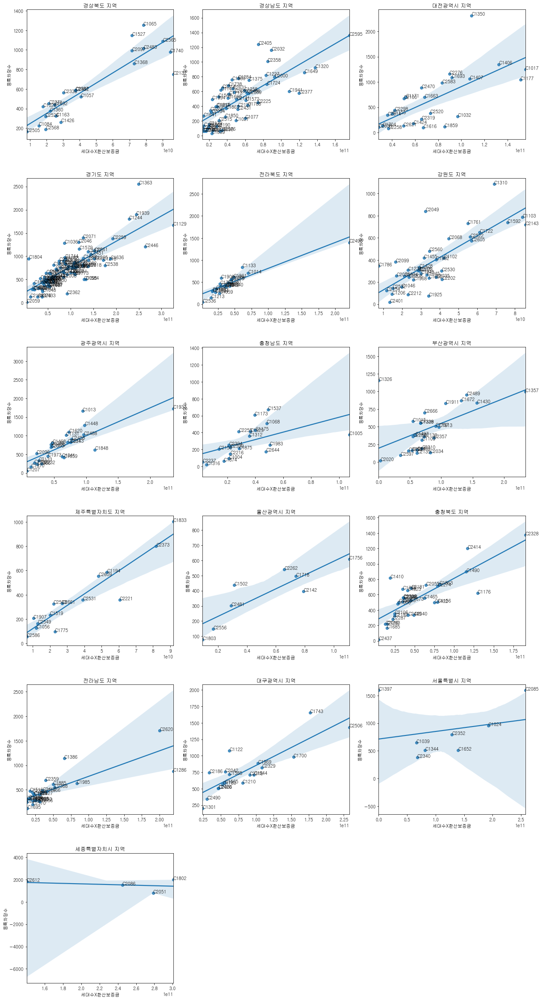

In [86]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(train_depot['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=train_depot.loc[train_depot['지역'] == n], x='세대수X환산보증금', y='등록차량수')
    for i, code in enumerate(train_depot.loc[train_depot['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (train_depot.loc[train_depot['지역'] == n].reset_index(drop=True)['세대수X환산보증금'][i],
                              train_depot.loc[train_depot['지역'] == n].reset_index(drop=True)['등록차량수'][i]))
    plt.title('{} 지역'.format(n))

- 확실히 총세대수, 주차면수, 건축연면적보다는 휘귀선이 조금 더 정확한 것을 알 수 있습니다.

### 대중교통은 차량보유에 영향을 미칠까?

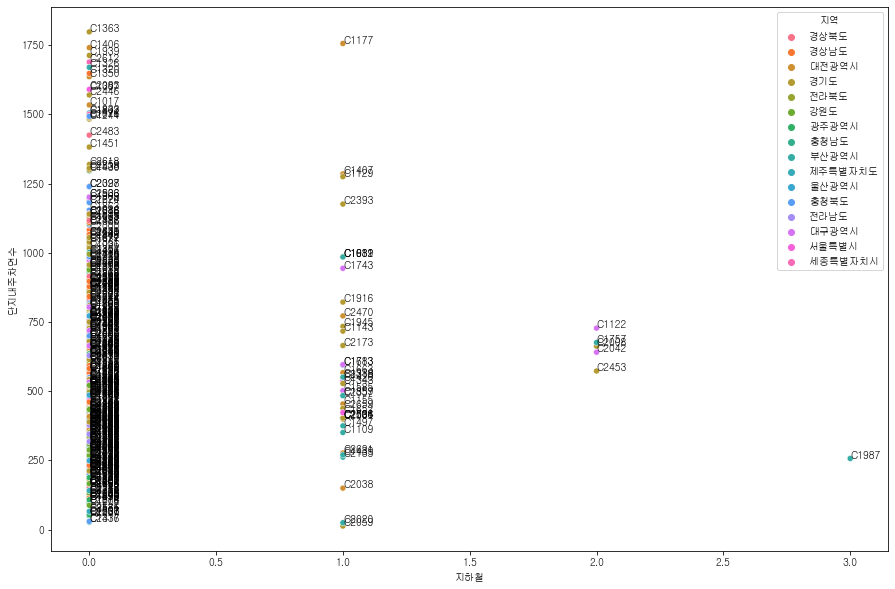

In [88]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_danji, x='지하철', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji['단지코드']):
    plots.annotate(code, (train_danji['지하철'][i], train_danji['단지내주차면수'][i]))
plt.show()

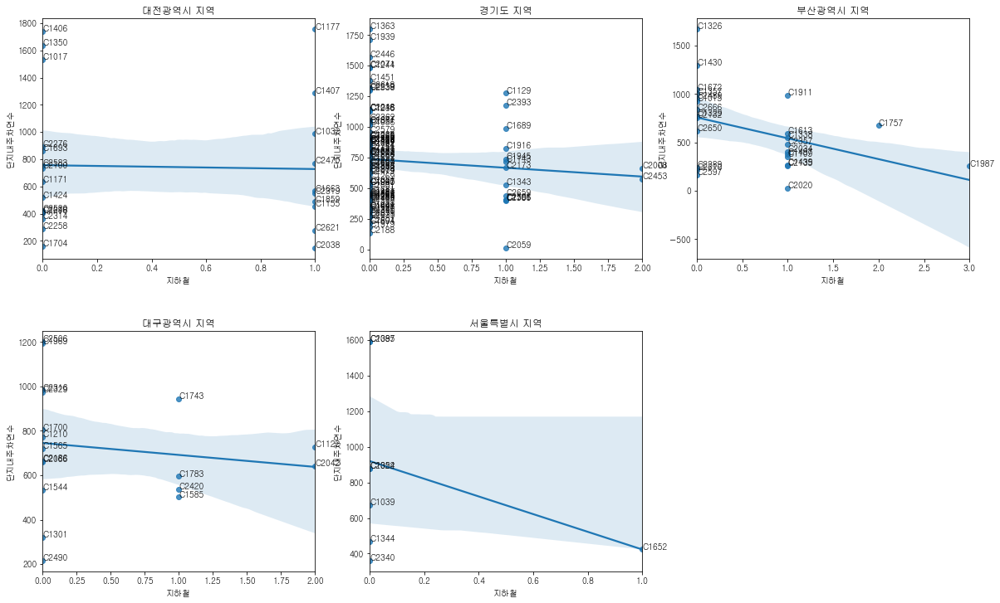

In [89]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(['대전광역시', '경기도', '부산광역시', '대구광역시', '서울특별시']):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=train_danji.loc[train_danji['지역'] == n], x='지하철', y='단지내주차면수')
    for i, code in enumerate(train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['지하철'][i],
                              train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

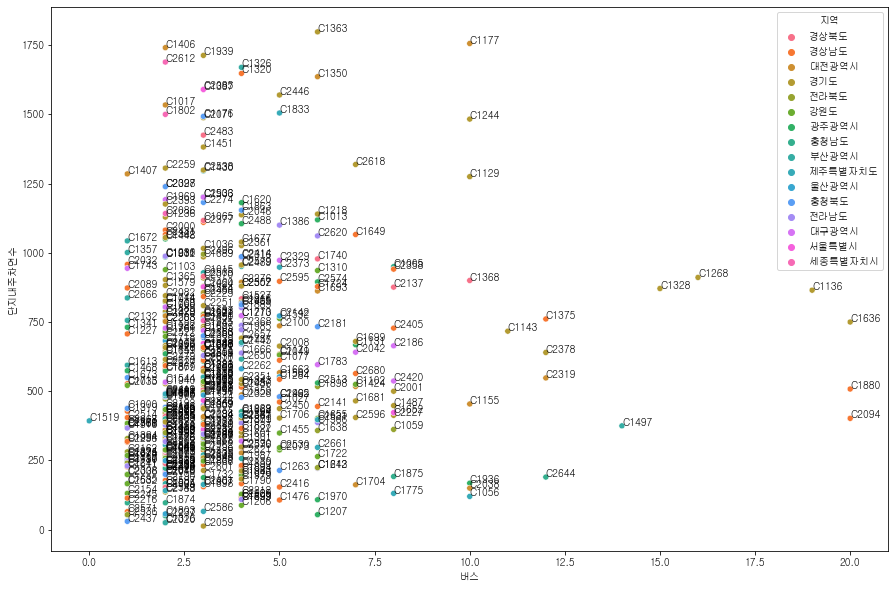

In [90]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_danji, x='버스', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji['단지코드']):
    plots.annotate(code, (train_danji['버스'][i], train_danji['단지내주차면수'][i]))
plt.show()

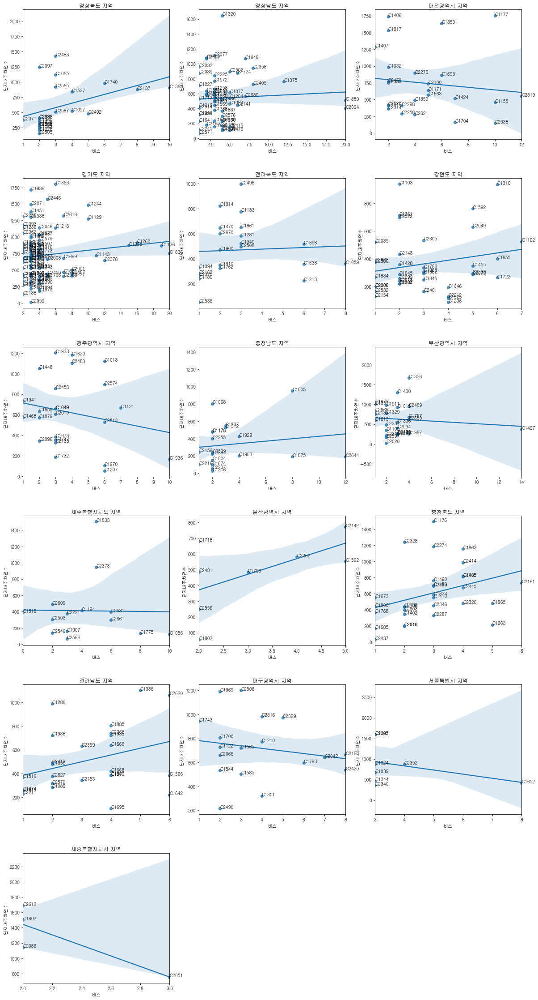

In [91]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(train_danji['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=train_danji.loc[train_danji['지역'] == n], x='버스', y='단지내주차면수')
    for i, code in enumerate(train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['버스'][i],
                              train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

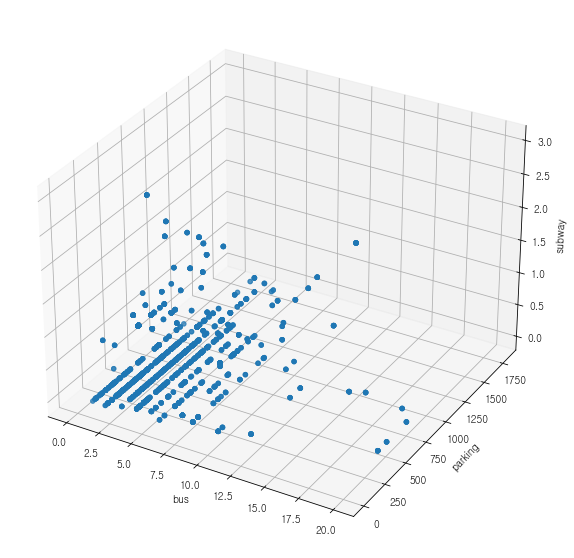

In [92]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection = '3d')

x = train['버스']
y = train['단지내주차면수']
z = train['지하철']

ax.set_xlabel("bus")
ax.set_ylabel("parking")
ax.set_zlabel("subway")

ax.scatter(x, y, z)

plt.show()

모르겠다

지하철과 버스를 통합해서 대중교통지수를 만들어보자. 지하철 1개의 영향을 버스 3~5개의 영향과도 맞먹을 것이다.

In [93]:
train_danji['대중교통'] = (train_danji['지하철'] * 3) + train_danji['버스']

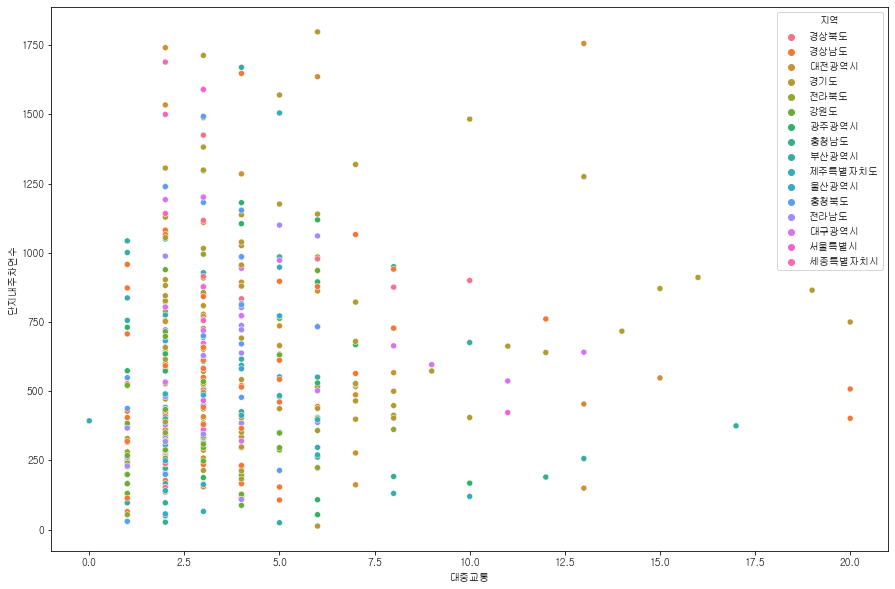

In [94]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_danji, x='대중교통', y='단지내주차면수', hue='지역')
#for i, code in enumerate(train_danji['단지코드']):
#    plots.annotate(code, (train_danji['대중교통'][i], train_danji['단지내주차면수'][i]))
plt.show()

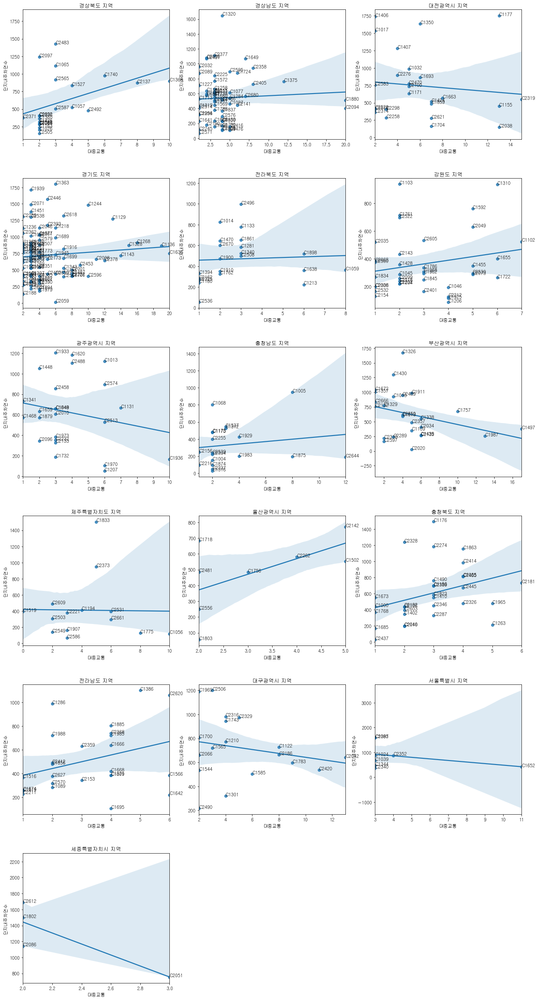

In [95]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(train_danji['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=train_danji.loc[train_danji['지역'] == n], x='대중교통', y='단지내주차면수')
    for i, code in enumerate(train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['대중교통'][i],
                              train_danji.loc[train_danji['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

### 대중교통이 하나도 없는 아파트 단지는?

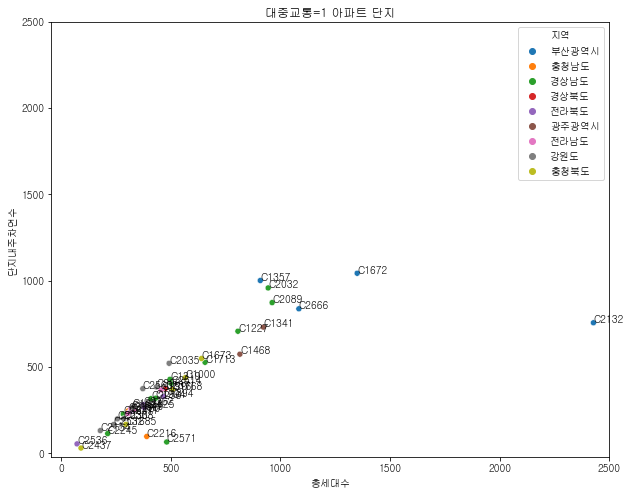

In [96]:
plt.figure(figsize=(10, 8))
plots = sns.scatterplot(data=train_danji.loc[train_danji['대중교통'] == 1], x='총세대수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji.loc[train_danji['대중교통'] == 1].reset_index()['단지코드']):
    plots.annotate(code, (train_danji.loc[train_danji['대중교통'] == 1].reset_index()['총세대수'][i],
                          train_danji.loc[train_danji['대중교통'] == 1].reset_index()['단지내주차면수'][i]))
plt.title('대중교통=1 아파트 단지')
plt.ylim(top = 2500)
plt.xlim(right = 2500)
plt.show()

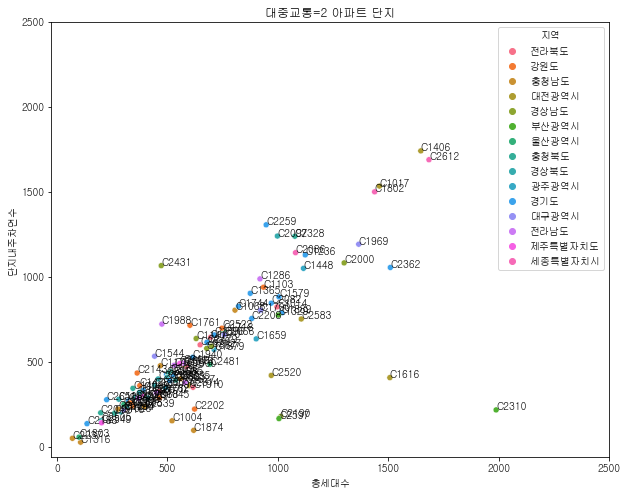

In [97]:
plt.figure(figsize=(10, 8))
plots = sns.scatterplot(data=train_danji.loc[train_danji['대중교통'] == 2], x='총세대수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji.loc[train_danji['대중교통'] == 2].reset_index()['단지코드']):
    plots.annotate(code, (train_danji.loc[train_danji['대중교통'] == 2].reset_index()['총세대수'][i],
                          train_danji.loc[train_danji['대중교통'] == 2].reset_index()['단지내주차면수'][i]))
plt.title('대중교통=2 아파트 단지')
plt.ylim(top = 2500)
plt.xlim(right = 2500)
plt.show()

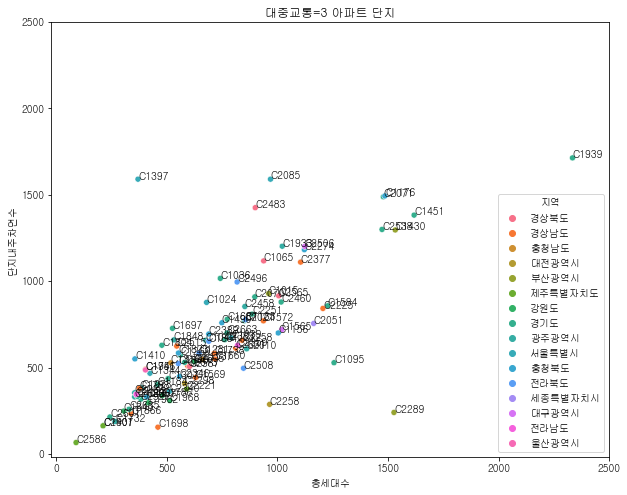

In [98]:
plt.figure(figsize=(10, 8))
plots = sns.scatterplot(data=train_danji.loc[train_danji['대중교통'] == 3], x='총세대수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji.loc[train_danji['대중교통'] == 3].reset_index()['단지코드']):
    plots.annotate(code, (train_danji.loc[train_danji['대중교통'] == 3].reset_index()['총세대수'][i],
                          train_danji.loc[train_danji['대중교통'] == 3].reset_index()['단지내주차면수'][i]))
plt.title('대중교통=3 아파트 단지')
plt.ylim(top = 2500)
plt.xlim(right = 2500)
plt.show()

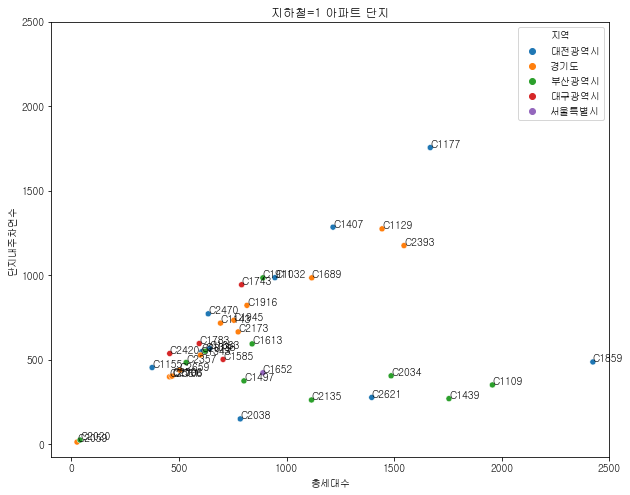

In [99]:
plt.figure(figsize=(10, 8))
plots = sns.scatterplot(data=train_danji.loc[train_danji['지하철'] == 1], x='총세대수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji.loc[train_danji['지하철'] == 1].reset_index()['단지코드']):
    plots.annotate(code, (train_danji.loc[train_danji['지하철'] == 1].reset_index()['총세대수'][i],
                          train_danji.loc[train_danji['지하철'] == 1].reset_index()['단지내주차면수'][i]))
plt.title('지하철=1 아파트 단지')
plt.ylim(top = 2500)
plt.xlim(right = 2500)
plt.show()

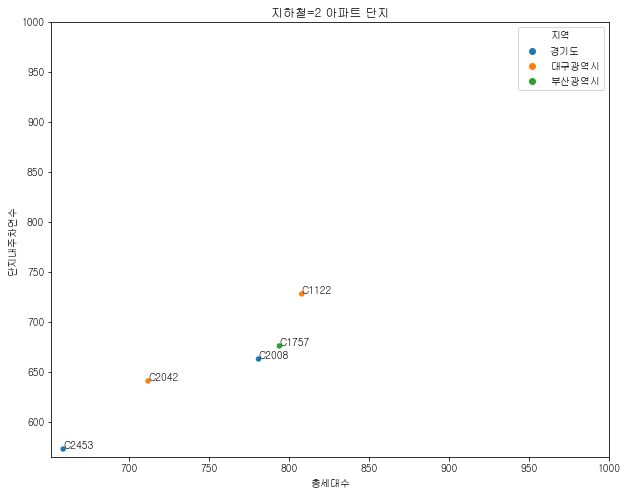

In [100]:
plt.figure(figsize=(10, 8))
plots = sns.scatterplot(data=train_danji.loc[train_danji['지하철'] == 2], x='총세대수', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_danji.loc[train_danji['지하철'] == 2].reset_index()['단지코드']):
    plots.annotate(code, (train_danji.loc[train_danji['지하철'] == 2].reset_index()['총세대수'][i],
                          train_danji.loc[train_danji['지하철'] == 2].reset_index()['단지내주차면수'][i]))
plt.title('지하철=2 아파트 단지')
plt.ylim(top = 1000)
plt.xlim(right = 1000)
plt.show()

### 세대수X환산보증금 총액은?

In [101]:
temp = train.groupby(['단지코드'])['세대수X환산보증금'].sum().reset_index()

In [102]:
train_deposit = pd.merge(train_danji, temp, how='inner', on='단지코드')

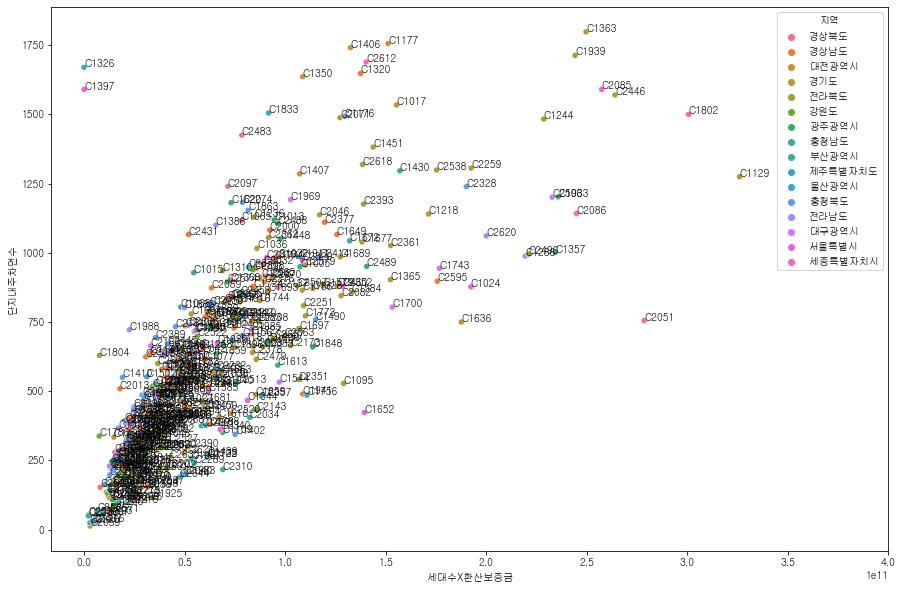

In [103]:
plt.figure(figsize=(15, 10))
plots = sns.scatterplot(data=train_deposit, x='세대수X환산보증금', y='단지내주차면수', hue='지역')
for i, code in enumerate(train_deposit['단지코드']):
    plots.annotate(code, (train_deposit['세대수X환산보증금'][i], train_deposit['단지내주차면수'][i]))
plt.xlim(right=400000000000)
plt.show()

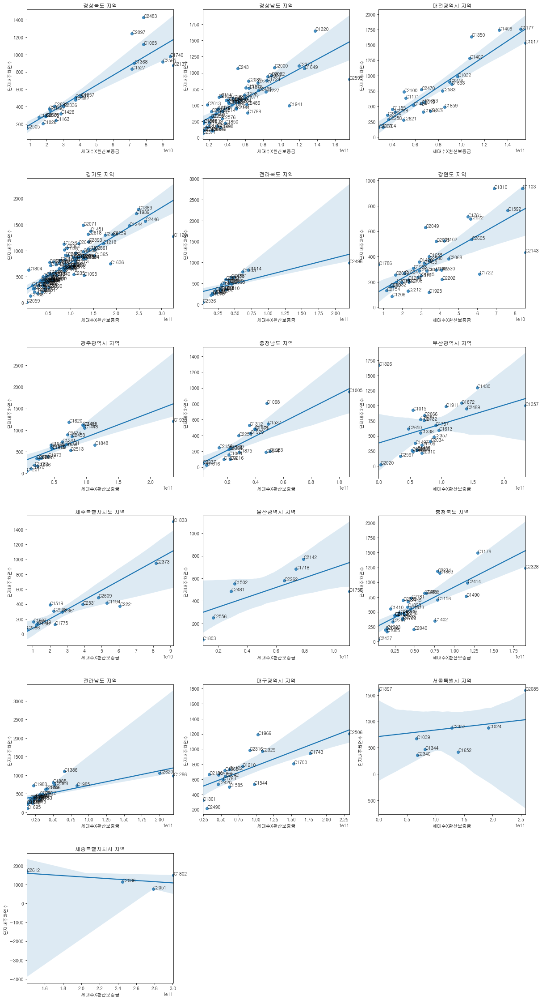

In [104]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(list(train_deposit['지역'].unique())):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=train_deposit.loc[train_deposit['지역'] == n], x='세대수X환산보증금', y='단지내주차면수')
    for i, code in enumerate(train_deposit.loc[train_deposit['지역'] == n].reset_index(drop=True)['단지코드']):
        plots.annotate(code, (train_deposit.loc[train_deposit['지역'] == n].reset_index(drop=True)['세대수X환산보증금'][i],
                              train_deposit.loc[train_deposit['지역'] == n].reset_index(drop=True)['단지내주차면수'][i]))
    plt.title('{} 지역'.format(n))

## REPLACING

# 전면 재수사

https://www.dacon.io/competitions/official/235745/talkboard/403665?page=1&dtype=recent

- 한 참가자 분이 문제제기한 위 글에 의하면, 하나의 단지가 두 개의 단지코드로 나뉘어져 있는 경우가 존재.
- 결국 하나의 타겟을 두 개 이상의 레코드로 따로 예측하고 있었다는 것이다. 정말 데이터가 너무 지저분하다.
- 따라서 주차면수와 등록차량수를 가지고 동일 단지가 존재하는지 여부를 살펴봐야 하며,
- 주차면수와 등록차량수가 다르더라도 같은 단지인데 찢어져 있는 단지가 존재할 수 있다는 것을 알아보자.

### 주차면수와 등록차량수가 동일한 단지

In [385]:
train_danji.loc[train_danji.duplicated(subset=['지역', '지하철', '버스', '단지내주차면수', '등록차량수'],
                keep=False)]

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수
274,C1397,370,서울특별시,9.0,0.0,3.0,1590.0,1595.0
297,C2085,969,서울특별시,0.0,0.0,3.0,1590.0,1595.0


- 두 단지는 하나의 단지입니다. 합치겠습니다.

In [386]:
train.loc[train['단지코드'] == 'C2085', '단지코드'] = 'C1397'
train.loc[train['단지코드'] == 'C1397', '총세대수'] = (
    train.loc[train['단지코드'] == 'C1397'].groupby(['단지코드'])['전용면적별세대수'].sum()[0]
)
train.loc[train['단지코드'] == 'C1397', '공가수'] = 9

### Qualification

'D' 는 상가에서 보여지는 자격유형입니다. 그러나 train, test 셋에 각각 존재합니다.

In [387]:
# train의 C1350의 D는 최빈값 A로 넣겠습니다.
train.loc[(train['자격유형'] == 'D') & (train['임대건물구분'] == '아파트'), '자격유형'] = (
    train.loc[(train['단지코드'] == 'C1350') & (~train['임대료'].isnull()), '자격유형'].mode()[0]
)

In [388]:
# test의 C1006의 D값은 최빈값인 C로 대체하겠습니다.
test.loc[(test['단지코드'] == 'C1006') & (test['임대건물구분'] == '아파트'), '자격유형'] = (
    test.loc[(test['단지코드'] == 'C1006') & (test['임대건물구분'] == '아파트'), '자격유형'].mode()[0]
)

### UnitType

전용면적별세대수의 합과 총세대수가 맞지 않는 단지는 값을 조정해줍니다.

In [389]:
# 경북혁신도시천년나무3단지
test.loc[test['단지코드'] == 'C2497', '전용면적별세대수'] = [114, 60, 275, 39]


# 충무공동혁신도시LH아파트5단지
train.loc[train['단지코드'] == 'C2405', '전용면적별세대수'] = [100, 100, 400]
# 경북혁신LH천년나무2단지
train.loc[train['단지코드'] == 'C1740', '전용면적별세대수'] = [305, 126, 184, 168]
# LH강남아이파크
train.loc[train['단지코드'] == 'C1024', '전용면적별세대수'] = [195, 60, 15, 154, 99, 48, 42, 53, 29, 23]
# 서울서초A4BL
train.loc[train['단지코드'] == 'C1344', '전용면적별세대수'] = [106, 96, 41, 39, 42, 100]
# 진천군 연미로 131 천년나무7단지
train.loc[train['단지코드'] == 'C1490', '전용면적별세대수'] = [105, 84, 472, 88]
# 나주빛가람LH3단지
train.loc[train['단지코드'] == 'C2620', '전용면적별세대수'] = [60, 227, 316, 160, 266]
# 남양주별내A1-3블록
train.loc[train['단지코드'] == 'C1804', '전용면적별세대수'] = [76, 82, 279, 28]
train = train.append({'단지코드': 'C1804',
              '총세대수': 478,
              '임대건물구분': '아파트',
              '지역': '경기도',
              '공급유형': '공공임대(10년)',
              '전용면적': 75.78,
              '전용면적별세대수': 13,
              '공가수': 3.0,
              '자격유형': 'A',
              '임대보증금': 78957000,
              '임대료': 530130,
              '지하철': 0.0,
              '버스': 3.0,
              '단지내주차면수': 629.0,
              '등록차량수': 951.0}, ignore_index=True)
# 대전대신2구역2단지
train = train.append({'단지코드': 'C2470',
                      '총세대수': 636,
                      '임대건물구분': '아파트',
                      '지역': '대전광역시',
                      '공급유형': '공공분양',
                      '전용면적': 74.99,
                      '전용면적별세대수': 72,
                      '공가수': 1.0,
                      '자격유형': 'A',
                      '임대보증금': 225013300,
                      '지하철': 1.0,
                      '버스': 2.0,
                      '단지내주차면수': 772.0,
                      '등록차량수': 887.0}, ignore_index=True)
train = train.append({'단지코드': 'C2470',
                      '총세대수': 636,
                      '임대건물구분': '아파트',
                      '지역': '대전광역시',
                      '공급유형': '공공분양',
                      '전용면적': 74.95,
                      '전용면적별세대수': 66,
                      '공가수': 1.0,
                      '자격유형': 'A',
                      '임대보증금': 226278000,
                      '지하철': 1.0,
                      '버스': 2.0,
                      '단지내주차면수': 772.0,
                      '등록차량수': 887.0}, ignore_index=True)
train = train.append({'단지코드': 'C2470',
                      '총세대수': 636,
                      '임대건물구분': '아파트',
                      '지역': '대전광역시',
                      '공급유형': '공공분양',
                      '전용면적': 74.99,
                      '전용면적별세대수': 92,
                      '공가수': 1.0,
                      '자격유형': 'A',
                      '임대보증금': 230417000,
                      '지하철': 1.0,
                      '버스': 2.0,
                      '단지내주차면수': 772.0,
                      '등록차량수': 887.0}, ignore_index=True)
# 속초청초아파트
#train.loc[train['단지코드'] == 'C1206', '총세대수'] = 478
train = train.append({'단지코드': 'C1206',
                      '총세대수': 755,
                      '임대건물구분': '아파트',
                      '지역': '강원도',
                      '공급유형': '공공분양',
                      '전용면적': 41.85,
                      '전용면적별세대수': 177,
                      '공가수': 1.0,
                      '자격유형': 'A',
                      '지하철': 0.0,
                      '버스': 4.0,
                      '단지내주차면수': 88.0,
                      '등록차량수': 90.0}, ignore_index=True)
train = train.append({'단지코드': 'C1206',
                      '총세대수': 755,
                      '임대건물구분': '아파트',
                      '지역': '강원도',
                      '공급유형': '공공분양',
                      '전용면적': 51.66,
                      '전용면적별세대수': 90,
                      '공가수': 1.0,
                      '자격유형': 'A',
                      '지하철': 0.0,
                      '버스': 4.0,
                      '단지내주차면수': 88.0,
                      '등록차량수': 90.0}, ignore_index=True)
#광주첨단H-2BL,H-3BL
#train.loc[train['단지코드'] == 'C1970', '총세대수'] = 200
# 평택고덕Ca1, Ca2
#train.loc[train['단지코드'] == 'C1894', '총세대수'] = 296

### 총세대수, 전용면적별세대수, 주차면수, 오차가 너무 심합니다. 이거 때문에 분석에 문제가 생깁니다.

#### 총세대수와 전용면적별세대수

전용면적별세대수를 전부 다 합쳐도 총세대수에 못 미치는 경우가 있습니다. 분양으로 나간 세대수는 총세대수에 포함되지 않는 까닭입니다. 조금 더 정확한 분석을 위해서는 해당 단지의 총세대수가 얼마인지 조정해줘야 할 필요성이 있습니다.

In [390]:
# train의 C1024만 해주면 됩니다.
train.loc[train['단지코드'] == 'C1024', '총세대수'] = (
    train.loc[train['단지코드'] == 'C1024'].groupby(['단지코드'])['전용면적별세대수'].sum()[0]
)

### Deposit / Rent Preprocessing

In [391]:
# '-' 값을 0으로 만들어줍니다.
train.loc[train['임대보증금'] == '-', '임대보증금'] = 0
test.loc[test['임대보증금'] == '-', '임대보증금'] = 0

train.loc[train['임대료'] == '-', '임대료'] = 0
test.loc[test['임대료'] == '-', '임대료'] = 0

In [392]:
# nan 값 때문에 object로 되어 있습니다. 일단 0으로 채워 줍니다.
train['임대보증금'] = train['임대보증금'].fillna(0)
test['임대보증금'] = test['임대보증금'].fillna(0)

train['임대료'] = train['임대료'].fillna(0)
test['임대료'] = test['임대료'].fillna(0)

In [393]:
# 계산을 위해서 int로 바꿔줍니다.
train['임대보증금'] = train['임대보증금'].astype(int)
test['임대보증금'] = test['임대보증금'].astype(int)

train['임대료'] = train['임대료'].astype(int)
test['임대료'] = test['임대료'].astype(int)

In [394]:
# 면적당으로 보증금과 임대료를 산출해서 역으로 채워넣겠습니다.
train['면적당보증금'] = train['임대보증금'] / train['전용면적']
train['면적당임대료'] = train['임대료'] / train['전용면적']

test['면적당보증금'] = test['임대보증금'] / test['전용면적']
test['면적당임대료'] = test['임대료'] / test['전용면적']

In [395]:
# 0 값을 다시 NULL 값으로 바꿉니다.
train.loc[(train['면적당보증금'] == 0), ['임대보증금', '면적당보증금']] = np.nan
train.loc[(train['면적당임대료'] == 0), ['임대료', '면적당임대료']] = np.nan

test.loc[(test['면적당보증금'] == 0), ['임대보증금', '면적당보증금']] = np.nan
test.loc[(test['면적당임대료'] == 0), ['임대료', '면적당임대료']] = np.nan

Train 의 보증금과 임대료가 비어있는 곳은 C1350, C1786, C2186, C1326 입니다.

In [396]:
# C1350은 공공분양이기 때문에 임대료가 없고 보증금이 매우 큽니다.
# 이 경우는 비슷한 공급유형의 면적당보증금을 가져오겠습니다.
# 임대료는 추후 작업하겠습니다.

# 같은 유형의 공공분양 단지의 면적당 보증금의 평균으로 채워줍니다.
train.loc[(train['단지코드'] == 'C1350') & (train['임대보증금'].isnull()), '면적당보증금'] = (
    train.loc[(train['공급유형'] == '공공분양') & (~train['임대보증금'].isnull()), '면적당보증금'].mean()
)

# 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
train.loc[(train['단지코드'] == 'C1350') & (train['임대보증금'].isnull()), '임대보증금'] = (
    train.loc[(train['단지코드'] == 'C1350') & (train['임대보증금'].isnull()), '전용면적']
    * train.loc[(train['단지코드'] == 'C1350') & (train['임대보증금'].isnull()), '면적당보증금']
)

In [397]:
# C1786 은 행복주택, K 유형의 아파트입니다.
# 동일한 공급유형, 자격유형의 값을 가져오겠습니다.
train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '면적당보증금'] = (
    train.loc[(train['공급유형'] == '행복주택') & (train['자격유형'] == 'K'), '면적당보증금'].mean()
)
train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '면적당임대료'] = (
    train.loc[(train['공급유형'] == '행복주택') & (train['자격유형'] == 'K'), '면적당임대료'].mean()
)

# 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '임대보증금'] = (
    train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '전용면적']
    * train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '면적당보증금']
)
train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '임대료'] = (
    train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '전용면적']
    * train.loc[(train['단지코드'] == 'C1786') & (train['자격유형'] == 'K'), '면적당임대료']
)

In [398]:
# C2186 단지는 같은 단지에 동일한 공급유형, 동일한 자격유형의 값이 있습니다.
# 해당 값으로 넣어주겠습니다.
train.loc[(train['단지코드'] == 'C2186') & (train['임대료'].isnull()), '면적당임대료'] = (
    train.loc[(train['단지코드'] == 'C2186') & (train['자격유형'] == 'H') & (~train['임대료'].isnull()), '면적당임대료'].mean()
)
train.loc[(train['단지코드'] == 'C2186') & (train['임대보증금'].isnull()), '면적당보증금'] = (
    train.loc[(train['단지코드'] == 'C2186') & (train['자격유형'] == 'H') & (~train['임대보증금'].isnull()), '면적당보증금'].mean()
)

# 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
train.loc[(train['단지코드'] == 'C2186') & (train['임대료'].isnull()), '임대료'] = (
    train.loc[(train['단지코드'] == 'C2186') & (train['임대료'].isnull()), '전용면적']
    * train.loc[(train['단지코드'] == 'C2186') & (train['임대료'].isnull()), '면적당임대료']
)
train.loc[(train['단지코드'] == 'C2186') & (train['임대보증금'].isnull()), '임대보증금'] = (
    train.loc[(train['단지코드'] == 'C2186') & (train['임대보증금'].isnull()), '전용면적']
    * train.loc[(train['단지코드'] == 'C2186') & (train['임대보증금'].isnull()), '면적당보증금']
)

In [399]:
# C1326 단지는 동일 지역에 H국민임대 단지가 없습니다. 전국적으로 4000~6500원 선이니 평균으로 넣어주겠습니다.
train.loc[train['단지코드'] == 'C1326', '면적당보증금'] = (
    train.loc[(train['공급유형'] == '국민임대') & (train['자격유형'] == 'H'), '면적당보증금'].mean()
)
train.loc[train['단지코드'] == 'C1326', '면적당임대료'] = (
    train.loc[(train['공급유형'] == '국민임대') & (train['자격유형'] == 'H'), '면적당임대료'].mean()
)

# 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
train.loc[train['단지코드'] == 'C1326', '임대보증금'] = (
    train.loc[train['단지코드'] == 'C1326', '면적당보증금']
    * train.loc[train['단지코드'] == 'C1326', '전용면적']
)
train.loc[train['단지코드'] == 'C1326', '임대료'] = (
    train.loc[train['단지코드'] == 'C1326', '면적당임대료']
    * train.loc[train['단지코드'] == 'C1326', '전용면적']
)

test의 보증금과 임대료가 비어 있는 곳은 C1267, C2152, C2335 입니다.

In [400]:
# C1267 단지는 train의 동일공급유형, 동일자격유형, 거기에 경기도를 뺀 지역의 평균을 넣겠습니다.
test.loc[(test['단지코드'] == 'C1267') & (test['임대보증금'].isnull()), '면적당보증금'] = (
    train.loc[(train['공급유형'] == '행복주택') & (train['자격유형'] == 'L') & (train['지역'] != '경기도'), '면적당보증금'].mean()
)
test.loc[(test['단지코드'] == 'C1267') & (test['임대료'].isnull()), '면적당임대료'] = (
    train.loc[(train['공급유형'] == '행복주택') & (train['자격유형'] == 'L') & (train['지역'] != '경기도'), '면적당임대료'].mean()
)

# 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
test.loc[(test['단지코드'] == 'C1267') & (test['임대보증금'].isnull()), '임대보증금'] = (
    test.loc[(test['단지코드'] == 'C1267') & (test['임대보증금'].isnull()), '전용면적']
    * test.loc[(test['단지코드'] == 'C1267') & (test['임대보증금'].isnull()), '면적당보증금']
)
test.loc[(test['단지코드'] == 'C1267') & (test['임대료'].isnull()), '임대료'] = (
    test.loc[(test['단지코드'] == 'C1267') & (test['임대료'].isnull()), '전용면적']
    * test.loc[(test['단지코드'] == 'C1267') & (test['임대료'].isnull()), '면적당임대료']
)

In [401]:
# C2152 단지는 train의 동일 공급유형, 자격유형의 전국 평균 값으로 넣겠습니다.
test.loc[test['단지코드'] == 'C2152', '면적당보증금'] = (
    train.loc[(train['공급유형'] == '영구임대') & (train['자격유형'] == 'C'), '면적당보증금'].mean()
)
test.loc[test['단지코드'] == 'C2152', '면적당임대료'] = (
    train.loc[(train['공급유형'] == '영구임대') & (train['자격유형'] == 'C'), '면적당임대료'].mean()
)

# 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
test.loc[test['단지코드'] == 'C2152', '임대보증금'] = (
    test.loc[test['단지코드'] == 'C2152', '전용면적']
    * test.loc[test['단지코드'] == 'C2152', '면적당보증금']
)
test.loc[test['단지코드'] == 'C2152', '임대료'] = (
    test.loc[test['단지코드'] == 'C2152', '전용면적']
    * test.loc[test['단지코드'] == 'C2152', '면적당임대료']
)

### 공공분양/장기전세의 임대료

임대보증금이 높고 임대료가 0원인 공공분양, 장기전세가 train set에 존재합니다. C1397, C1039, C1350, C2470, C1206 입니다.<br>
어차피 test에는 공공분양, 장기전세가 없습니다.

#### 장기전세

동일 단지의 비슷한 유형으로 바꿔주겠습니다.

In [402]:
# # C1397은 같은 단지의 공공임대(10년) 값을 그대로 붙여주겠습니다. 평형수가 그나마 비슷해서입니다.
# train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '면적당보증금'] = (
#     train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '공공임대(10년)'), '면적당보증금'].mean()
# )
# train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '면적당임대료'] = (
#     train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '공공임대(10년)'), '면적당임대료'].mean()
# )
# # 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
# train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '임대보증금'] = (
#     train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '면적당보증금']
#     * train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '전용면적']
# )
# train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '임대료'] = (
#     train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '면적당임대료']
#     * train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '전용면적']
# )
# # 장기전세를 공공임대(10년)로 바꿔주겠습니다.
# train.loc[(train['단지코드'] == 'C1397') & (train['공급유형'] == '장기전세'), '공급유형'] = '공공임대(10년)'

In [403]:
# train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '면적당보증금'] = (
#     train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '국민임대'), '면적당보증금'].mean()
# )
# train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '면적당임대료'] = (
#     train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '국민임대'), '면적당임대료'].mean()
# )
# # 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
# train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '임대보증금'] = (
#     train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '면적당보증금']
#     * train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '전용면적']
# )
# train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '임대료'] = (
#     train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '면적당임대료']
#     * train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '전용면적']
# )
# # 장기전세를 국민임대로 바꿔주겠습니다.
# train.loc[(train['단지코드'] == 'C1039') & (train['공급유형'] == '장기전세'), '공급유형'] = '국민임대'

#### 공공분양

In [404]:
# # C1350은 같은 단지의 공공임대(10년) 값을 그대로 붙여주겠습니다.
# train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '면적당보증금'] = (
#     train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공임대(10년)'), '면적당보증금'].mean()
# )
# train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '면적당임대료'] = (
#     train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공임대(10년)'), '면적당임대료'].mean()
# )
# # 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
# train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '임대보증금'] = (
#     train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '면적당보증금']
#     * train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '전용면적']
# )
# train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '임대료'] = (
#     train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '면적당임대료']
#     * train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '전용면적']
# )
# # 공공분양를 공공임대(10년)로 바꿔주겠습니다.
# train.loc[(train['단지코드'] == 'C1350') & (train['공급유형'] == '공공분양'), '공급유형'] = '공공임대(10년)'

In [405]:
# # C2470은 같은 단지의 공공임대(5년) 값을 그대로 붙여주겠습니다.
# train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '면적당보증금'] = (
#     train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공임대(5년)'), '면적당보증금'].mean()
# )
# train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '면적당임대료'] = (
#     train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공임대(5년)'), '면적당임대료'].mean()
# )
# # 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
# train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '임대보증금'] = (
#     train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '면적당보증금']
#     * train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '전용면적']
# )
# train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '임대료'] = (
#     train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '면적당임대료']
#     * train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '전용면적']
# )
# # 공공분양를 공공임대(5년)로 바꿔주겠습니다.
# train.loc[(train['단지코드'] == 'C2470') & (train['공급유형'] == '공공분양'), '공급유형'] = '공공임대(5년)'

In [406]:
# # C1206은 같은 단지의 영구임대 값을 그대로 붙여주겠습니다.
# train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '면적당보증금'] = (
#     train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '영구임대'), '면적당보증금'].mean()
# )
# train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '면적당임대료'] = (
#     train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '영구임대'), '면적당임대료'].mean()
# )
# # 면적당보증금과 전용면적을 곱해서 임대보증금을 만들어줍니다.
# train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '임대보증금'] = (
#     train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '면적당보증금']
#     * train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '전용면적']
# )
# train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '임대료'] = (
#     train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '면적당임대료']
#     * train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '전용면적']
# )
# # 공공분양를 공공임대(5년)로 바꿔주겠습니다.
# train.loc[(train['단지코드'] == 'C1206') & (train['공급유형'] == '공공분양'), '공급유형'] = '영구임대'

In [407]:
train['환산보증금'] = train['임대료'] * 354 + train['임대보증금']
test['환산보증금'] = test['임대료'] * 354 + test['임대보증금']

## VALUE PREPROCCESSING

In [491]:
train.loc[train['단지코드'] == 'C1206']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,건축연면적,환산보증금,면적당환산보증금,세대수X환산보증금
647,C1206,755,아파트,강원도,영구임대,26.37,239,1.0,C,3141000,69900,0.0,4.0,88.0,90.0,6302.43,27885600,1057474.0,6664658400
648,C1206,755,아파트,강원도,영구임대,31.32,239,1.0,C,3731000,83020,0.0,4.0,88.0,90.0,7485.48,33120080,1057474.0,7915699120
649,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0
650,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0
651,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0
652,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0
653,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0
654,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0
655,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0
656,C1206,755,상가,강원도,임대상가,31.84,1,1.0,D,0,0,0.0,4.0,88.0,90.0,31.84,0,0.0,0


- 속초 청초 아파트, 무려 1993년에 지어진 아파트입니다. 30년이 더 되었습니다.
- 속초 청초 아파트 데이터는 조금 특이합니다. 영구임대는 478세대가 있습니다.
- 그러나 분양 세대까지 합쳐서 755 세대입니다. 여기서는 또 총 세대수를 755로 해놨습니다.
- 네이버 부동산 정보에 의하면 주차는 약 400개 입니다.
- 근데 여기는 또 주차면수가 88개라고 합니다.
- 지도를 살펴봐도 400개는 안되어보입니다. 그렇다고 88개는 또 말이 안됩니다.
- 근데 등록차량수는 또 90대 입니다.
- 알았습니다. 해당 단지는 분양세대와 임대세대까지 755호의 단지는 맞지만, 임대세대는 478세대, 그리고 임대단지 앞에 있는 주차면수는 88개가 맞습니다.
- 분양단지까지 했을 때, 주차면수는 늘어나지만, 그걸 원하는 것은 아닙니다.
- 즉, 해당 단지는 세대수를 478로 줄이는 게 맞습니다.

In [381]:
train.loc[train['공급유형'] == '공공분양']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,건축연면적,환산보증금,면적당환산보증금,세대수X환산보증금
2331,C1350,1401,아파트,대전광역시,공공분양,74.94,317,2.0,D,0,0,0.0,6.0,1636.0,2315.0,23755.98,0,2759299.0,0
2332,C1350,1401,아파트,대전광역시,공공분양,74.94,137,2.0,D,0,0,0.0,6.0,1636.0,2315.0,10266.78,0,2759299.0,0
2333,C1350,1401,아파트,대전광역시,공공분양,74.94,22,2.0,D,0,0,0.0,6.0,1636.0,2315.0,1648.68,0,2759299.0,0
2334,C1350,1401,아파트,대전광역시,공공분양,84.94,164,2.0,D,0,0,0.0,6.0,1636.0,2315.0,13930.16,0,2759299.0,0
2335,C1350,1401,아파트,대전광역시,공공분양,84.94,19,2.0,D,0,0,0.0,6.0,1636.0,2315.0,1613.86,0,2759299.0,0
2336,C1350,1401,아파트,대전광역시,공공분양,84.96,26,2.0,D,0,0,0.0,6.0,1636.0,2315.0,2208.96,0,2759299.0,0
2337,C1350,1401,아파트,대전광역시,공공분양,84.97,26,2.0,D,0,0,0.0,6.0,1636.0,2315.0,2209.22,0,2759299.0,0
2953,C2470,636,아파트,대전광역시,공공분양,74.99,72,1.0,A,225013300,0,1.0,2.0,772.0,887.0,5399.28,225013300,3000577.0,16200957600
2954,C2470,636,아파트,대전광역시,공공분양,74.95,66,1.0,A,226278000,0,1.0,2.0,772.0,887.0,4946.70,226278000,3019053.0,14934348000
2955,C2470,636,아파트,대전광역시,공공분양,74.99,92,1.0,A,230417000,0,1.0,2.0,772.0,887.0,6899.08,230417000,3072636.0,21198364000


In [382]:
test.loc[test['공급유형'] == '공공분양']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,건축연면적,환산보증금,면적당환산보증금,세대수X환산보증금


In [383]:
train.loc[train['단지코드'] == 'C1350']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,건축연면적,환산보증금,면적당환산보증금,세대수X환산보증금
2331,C1350,1401,아파트,대전광역시,공공분양,74.94,317,2.0,D,0,0,0.0,6.0,1636.0,2315.0,23755.98,0,2759299.0,0
2332,C1350,1401,아파트,대전광역시,공공분양,74.94,137,2.0,D,0,0,0.0,6.0,1636.0,2315.0,10266.78,0,2759299.0,0
2333,C1350,1401,아파트,대전광역시,공공분양,74.94,22,2.0,D,0,0,0.0,6.0,1636.0,2315.0,1648.68,0,2759299.0,0
2334,C1350,1401,아파트,대전광역시,공공분양,84.94,164,2.0,D,0,0,0.0,6.0,1636.0,2315.0,13930.16,0,2759299.0,0
2335,C1350,1401,아파트,대전광역시,공공분양,84.94,19,2.0,D,0,0,0.0,6.0,1636.0,2315.0,1613.86,0,2759299.0,0
2336,C1350,1401,아파트,대전광역시,공공분양,84.96,26,2.0,D,0,0,0.0,6.0,1636.0,2315.0,2208.96,0,2759299.0,0
2337,C1350,1401,아파트,대전광역시,공공분양,84.97,26,2.0,D,0,0,0.0,6.0,1636.0,2315.0,2209.22,0,2759299.0,0
2338,C1350,1401,아파트,대전광역시,공공임대(10년),51.99,106,2.0,A,28013000,408600,0.0,6.0,1636.0,2315.0,5510.94,172657400,3320973.0,18301684400
2339,C1350,1401,아파트,대전광역시,공공임대(10년),59.91,13,2.0,A,37474000,519350,0.0,6.0,1636.0,2315.0,778.83,221323900,3694273.0,2877210700
2340,C1350,1401,아파트,대전광역시,공공임대(10년),59.92,223,2.0,A,37385000,516130,0.0,6.0,1636.0,2315.0,13362.16,220095020,3673148.0,49081189460


In [384]:
train.loc[train['단지코드'] == 'C2470']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,건축연면적,환산보증금,면적당환산보증금,세대수X환산보증금
2580,C2470,636,아파트,대전광역시,공공임대(5년),39.90,96,1.0,A,23000000,340000,1.0,2.0,772.0,887.0,3830.40,143360000,3592982.0,13762560000
2581,C2470,636,아파트,대전광역시,공공임대(5년),46.81,264,1.0,A,26000000,380000,1.0,2.0,772.0,887.0,12357.84,160520000,3429182.0,42377280000
2582,C2470,636,아파트,대전광역시,공공임대(5년),59.95,46,1.0,A,32000000,480000,1.0,2.0,772.0,887.0,2757.70,201920000,3368140.0,9288320000
2953,C2470,636,아파트,대전광역시,공공분양,74.99,72,1.0,A,225013300,0,1.0,2.0,772.0,887.0,5399.28,225013300,3000577.0,16200957600
2954,C2470,636,아파트,대전광역시,공공분양,74.95,66,1.0,A,226278000,0,1.0,2.0,772.0,887.0,4946.70,226278000,3019053.0,14934348000
2955,C2470,636,아파트,대전광역시,공공분양,74.99,92,1.0,A,230417000,0,1.0,2.0,772.0,887.0,6899.08,230417000,3072636.0,21198364000


In [385]:
train.loc[train['단지코드'] == 'C1350']['전용면적별세대수'].sum()

1401

# TESTING

### 1. 방의 개수가 차량 보유에 영향을 미치는가?

In [323]:
train.loc[train['전용면적'] < 35, '방개수'] = '1룸'
train.loc[train['전용면적'] >= 35, '방개수'] = '2룸'
train.loc[train['전용면적'] >= 45, '방개수'] = '3룸'
train.loc[train['전용면적'] >= 56, '방개수'] = '4룸'
train.loc[train['전용면적'] >= 77, '방개수'] = '5룸'

In [324]:
test.loc[test['전용면적'] < 35, '방개수'] = '1룸'
test.loc[test['전용면적'] >= 35, '방개수'] = '2룸'
test.loc[test['전용면적'] >= 45, '방개수'] = '3룸'
test.loc[test['전용면적'] >= 56, '방개수'] = '4룸'
test.loc[test['전용면적'] >= 77, '방개수'] = '5룸'

In [228]:
rooms = pd.pivot_table(train.loc[train['임대건물구분'] != '상가'],
                       index='단지코드', columns='방개수', values='전용면적별세대수',
                       aggfunc='sum')

In [229]:
temp = train.groupby(['단지코드'])[['총세대수', '지역', '단지내주차면수', '등록차량수']].max()

In [230]:
rooms_danji = pd.concat([rooms, temp], axis=1)

In [231]:
rooms_danji['1룸비율'] = rooms_danji['1룸'] / rooms_danji['총세대수']
rooms_danji['2룸비율'] = rooms_danji['2룸'] / rooms_danji['총세대수']
rooms_danji['3룸비율'] = rooms_danji['3룸'] / rooms_danji['총세대수']
rooms_danji['4룸비율'] = rooms_danji['4룸'] / rooms_danji['총세대수']
rooms_danji['5룸비율'] = rooms_danji['5룸'] / rooms_danji['총세대수']

rooms_danji['단지내주차면수/총세대수'] = rooms_danji['단지내주차면수'] / rooms_danji['총세대수']
rooms_danji['등록차량수/총세대수'] = rooms_danji['등록차량수'] / rooms_danji['총세대수']
rooms_danji['등록차량수/단지내주차면수'] = rooms_danji['등록차량수'] / rooms_danji['단지내주차면수']

In [232]:
rooms_cols = ['1룸비율', '2룸비율', '3룸비율', '4룸비율', '5룸비율']

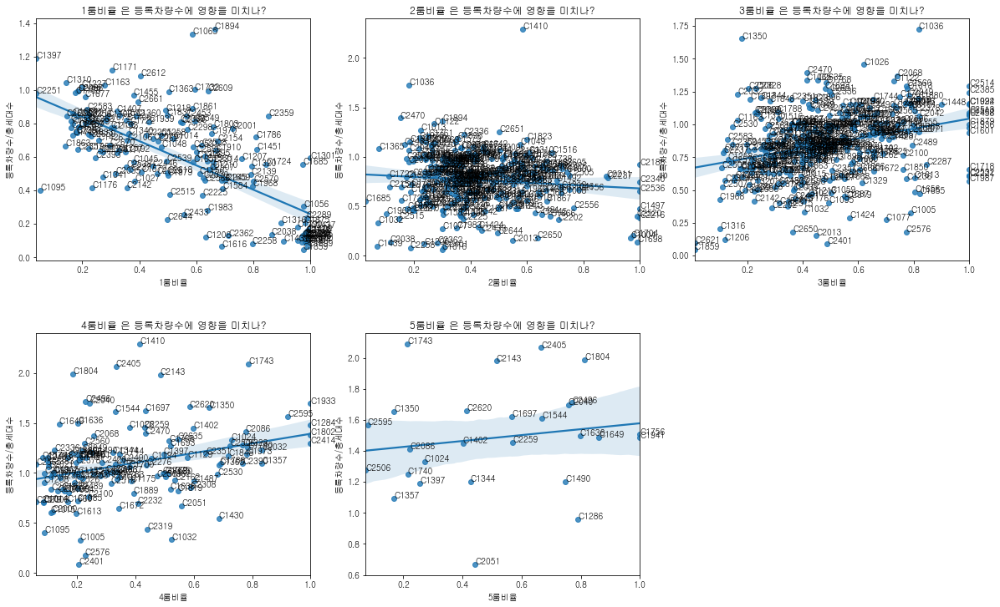

In [233]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(rooms_cols):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=rooms_danji, x=n, y='등록차량수/총세대수')
    for i, code in enumerate(rooms_danji.reset_index(drop=False)['단지코드']):
        plots.annotate(code, (rooms_danji.reset_index(drop=False)[n][i],
                              rooms_danji.reset_index(drop=False)['등록차량수/총세대수'][i]))
    plt.title('{} 은 등록차량수에 영향을 미치나?'.format(n))

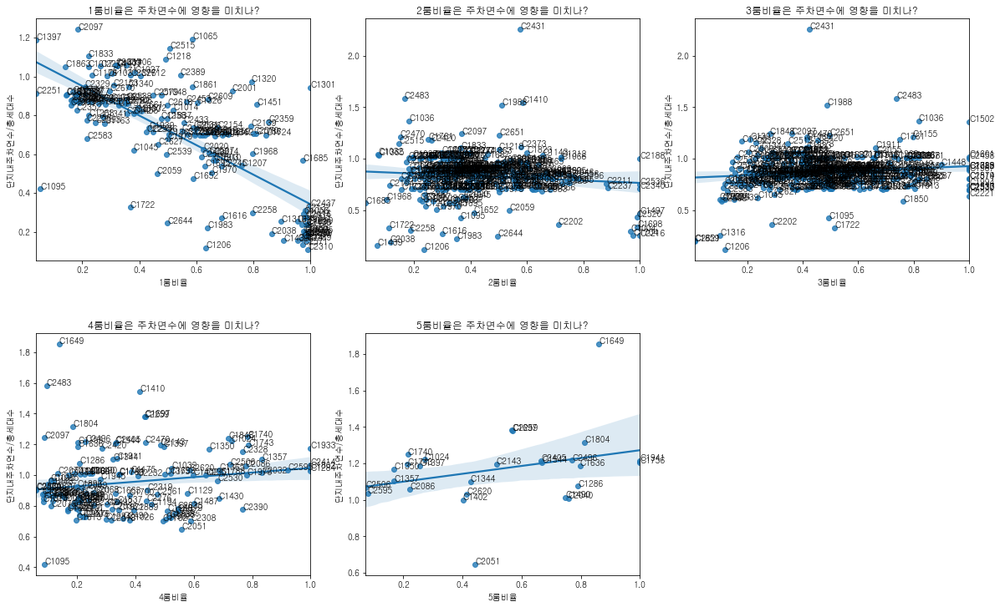

In [234]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(rooms_cols):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=rooms_danji, x=n, y='단지내주차면수/총세대수')
    for i, code in enumerate(rooms_danji.reset_index(drop=False)['단지코드']):
        plots.annotate(code, (rooms_danji.reset_index(drop=False)[n][i],
                              rooms_danji.reset_index(drop=False)['단지내주차면수/총세대수'][i]))
    plt.title('{}은 주차면수에 영향을 미치나?'.format(n))

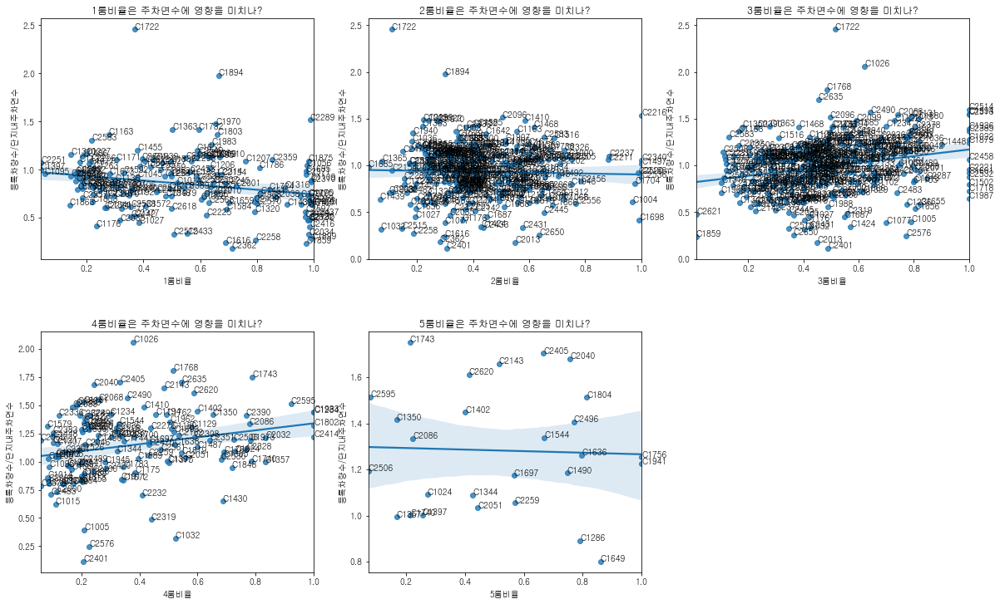

In [235]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(rooms_cols):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=rooms_danji, x=n, y='등록차량수/단지내주차면수')
    for i, code in enumerate(rooms_danji.reset_index(drop=False)['단지코드']):
        plots.annotate(code, (rooms_danji.reset_index(drop=False)[n][i],
                              rooms_danji.reset_index(drop=False)['등록차량수/단지내주차면수'][i]))
    plt.title('{}은 주차면수에 영향을 미치나?'.format(n))

### 2. 크기 분류가 차량 보유에 영향을 미치는가?

In [325]:
# 80 ~ 은 대형
# 40 ~ 80 은 중형
# ~ 40 은 소형

train.loc[train['전용면적'] < 40, '전용면적구분'] = '소형'
train.loc[train['전용면적'] >= 40, '전용면적구분'] = '중형'
train.loc[train['전용면적'] >= 80, '전용면적구분'] = '대형'

test.loc[test['전용면적'] < 40, '전용면적구분'] = '소형'
test.loc[test['전용면적'] >= 40, '전용면적구분'] = '중형'
test.loc[test['전용면적'] >= 80, '전용면적구분'] = '대형'

In [237]:
size = pd.pivot_table(train.loc[train['임대건물구분'] != '상가'],
                       index='단지코드', columns='전용면적구분', values='전용면적별세대수',
                       aggfunc='sum')

In [238]:
temp = train.groupby(['단지코드'])[['총세대수', '지역', '단지내주차면수', '등록차량수']].max()

In [239]:
size_danji = pd.concat([size, temp], axis=1)

In [240]:
size_danji['소형비율'] = size_danji['소형'] / size_danji['총세대수']
size_danji['중형비율'] = size_danji['중형'] / size_danji['총세대수']
size_danji['대형비율'] = size_danji['대형'] / size_danji['총세대수']

size_danji['단지내주차면수/총세대수'] = size_danji['단지내주차면수'] / size_danji['총세대수']
size_danji['등록차량수/총세대수'] = size_danji['등록차량수'] / size_danji['총세대수']
size_danji['등록차량수/단지내주차면수'] = size_danji['등록차량수'] / size_danji['단지내주차면수']

In [241]:
size_cols = ['소형비율', '중형비율', '대형비율']

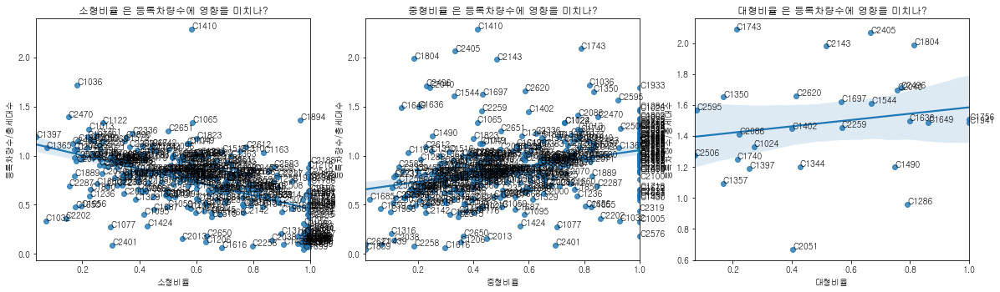

In [242]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(size_cols):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=size_danji, x=n, y='등록차량수/총세대수')
    for i, code in enumerate(size_danji.reset_index(drop=False)['단지코드']):
        plots.annotate(code, (size_danji.reset_index(drop=False)[n][i],
                              size_danji.reset_index(drop=False)['등록차량수/총세대수'][i]))
    plt.title('{} 은 등록차량수에 영향을 미치나?'.format(n))

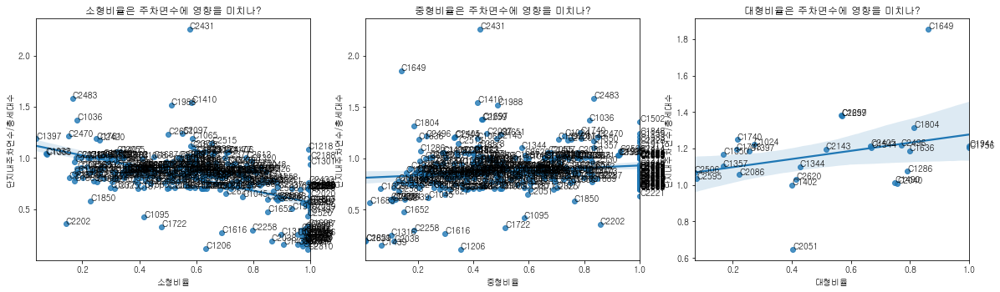

In [243]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(size_cols):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=size_danji, x=n, y='단지내주차면수/총세대수')
    for i, code in enumerate(size_danji.reset_index(drop=False)['단지코드']):
        plots.annotate(code, (size_danji.reset_index(drop=False)[n][i],
                              size_danji.reset_index(drop=False)['단지내주차면수/총세대수'][i]))
    plt.title('{}은 주차면수에 영향을 미치나?'.format(n))

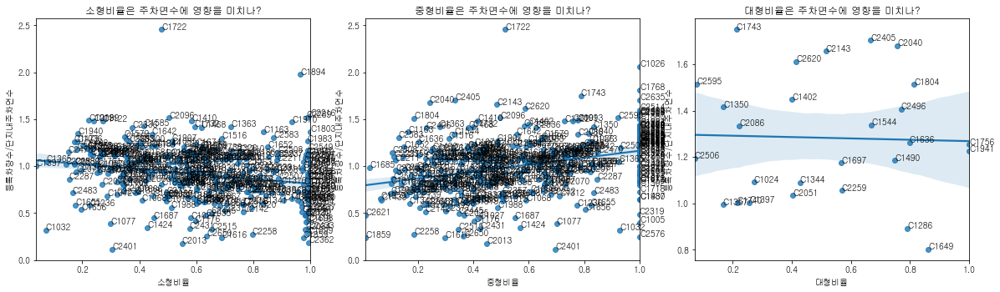

In [244]:
fig = plt.figure(figsize=(20, 40))
for i, n in enumerate(size_cols):
    plt.subplot(6, 3, i+1)
    plt.subplots_adjust(hspace=0.3)
    plots = sns.regplot(data=size_danji, x=n, y='등록차량수/단지내주차면수')
    for i, code in enumerate(size_danji.reset_index(drop=False)['단지코드']):
        plots.annotate(code, (size_danji.reset_index(drop=False)[n][i],
                              size_danji.reset_index(drop=False)['등록차량수/단지내주차면수'][i]))
    plt.title('{}은 주차면수에 영향을 미치나?'.format(n))

### 3. 땅값이 중요할까?

어떻게 하면 더 정확한 지가를 구할 수 있을까?

### 4. 지역별 세대, 성별 분포는 어떤 영향을 미칠까?

In [326]:
ag = age_gender.set_index('지역')

In [327]:
ag.loc['전체 평균'] = ag.mean()
ag.loc['광역시 평균'] = ag.loc[(ag.index.str.contains('시')) & (~ag.index.str.contains('세종'))].mean()
ag.loc['도 평균'] = ag.loc[ag.index.str.contains('도')].mean()

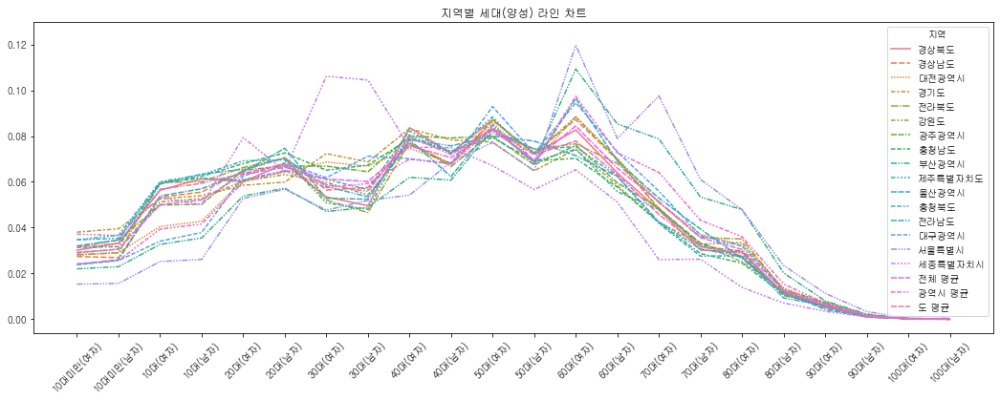

In [328]:
fig = plt.figure(figsize = (18, 6))
sns.lineplot(data=ag.T, )
plt.title('지역별 세대(양성) 라인 차트')
plt.xticks(rotation=45)
plt.ylim(top=0.13)
plt.show()

In [329]:
ag2 = age_gender.set_index('지역')

In [330]:
ag2['10대미만'] = ag2.iloc[:, 0:2].sum(axis=1)
for i in range(1, 11):
    ag2['{}0대'.format(i)] = ag2.iloc[:, i*2:(i*2)+2].sum(axis=1)

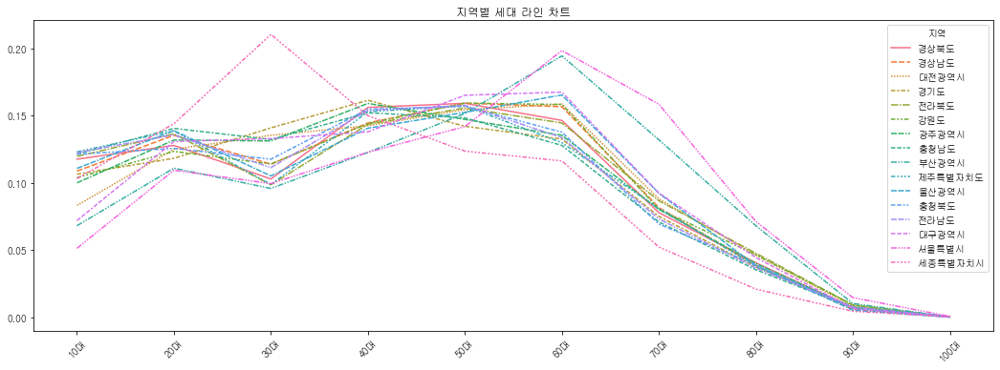

In [250]:
fig = plt.figure(figsize = (18, 6))
sns.lineplot(data=ag2.iloc[:, 23:].T)
plt.title('지역별 세대 라인 차트')
plt.xticks(rotation=45)
plt.show()

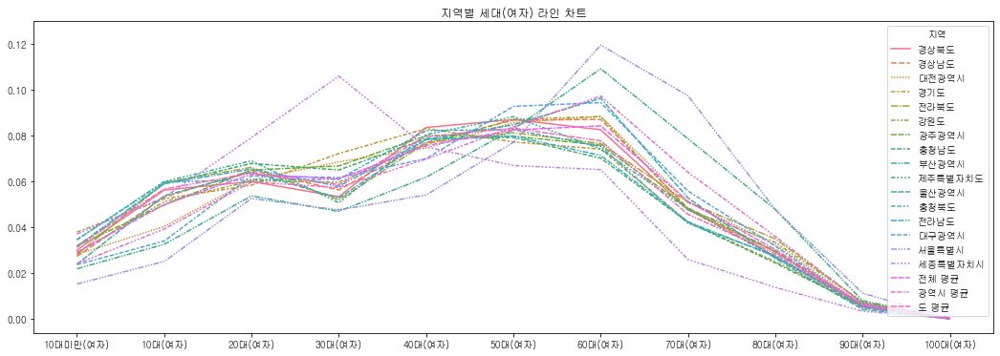

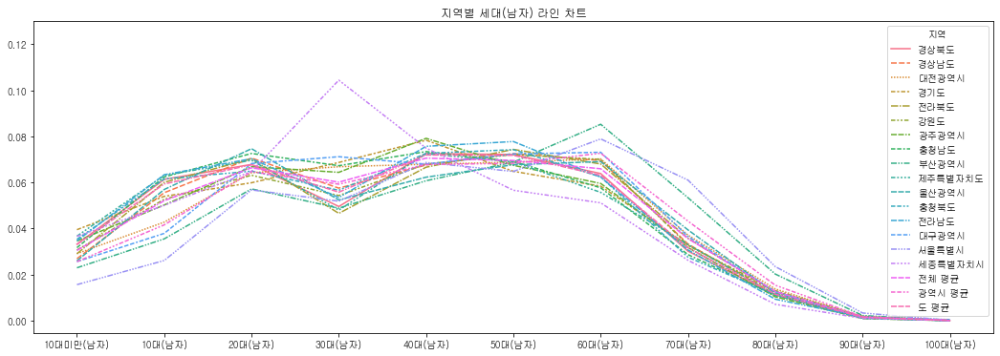

In [251]:
fig = plt.figure(figsize = (18, 6))
sns.lineplot(data=ag.loc[:, ag.columns.str.contains('여자')].T)
plt.title('지역별 세대(여자) 라인 차트')
plt.ylim(top=0.13)
plt.show()

fig = plt.figure(figsize = (18, 6))
sns.lineplot(data=ag.loc[:, ag.columns.str.contains('남자')].T)
plt.title('지역별 세대(남자) 라인 차트')
plt.ylim(top=0.13)
plt.show()

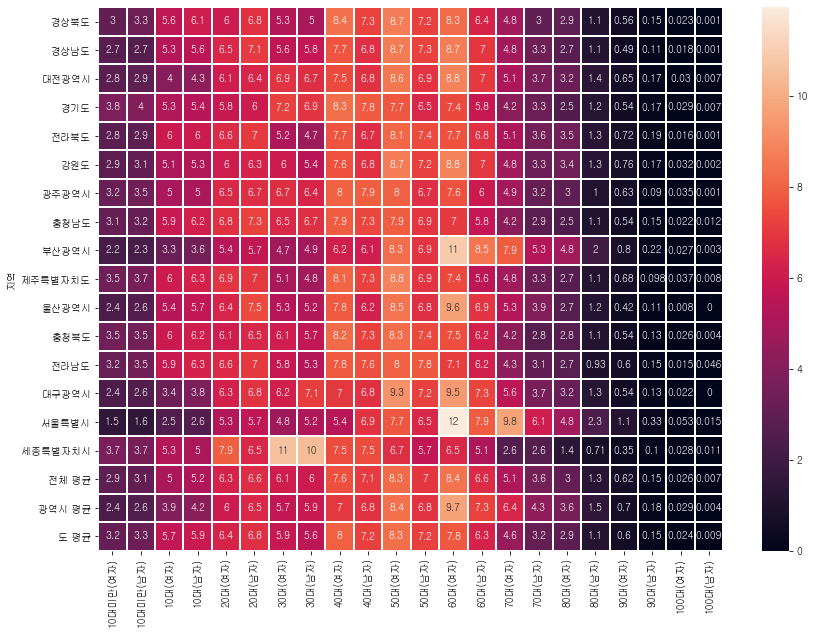

In [252]:
plt.figure(figsize=(14, 10))
sns.heatmap((ag*100).round(3),
           annot=True, linewidths=0.01,)

plt.show()

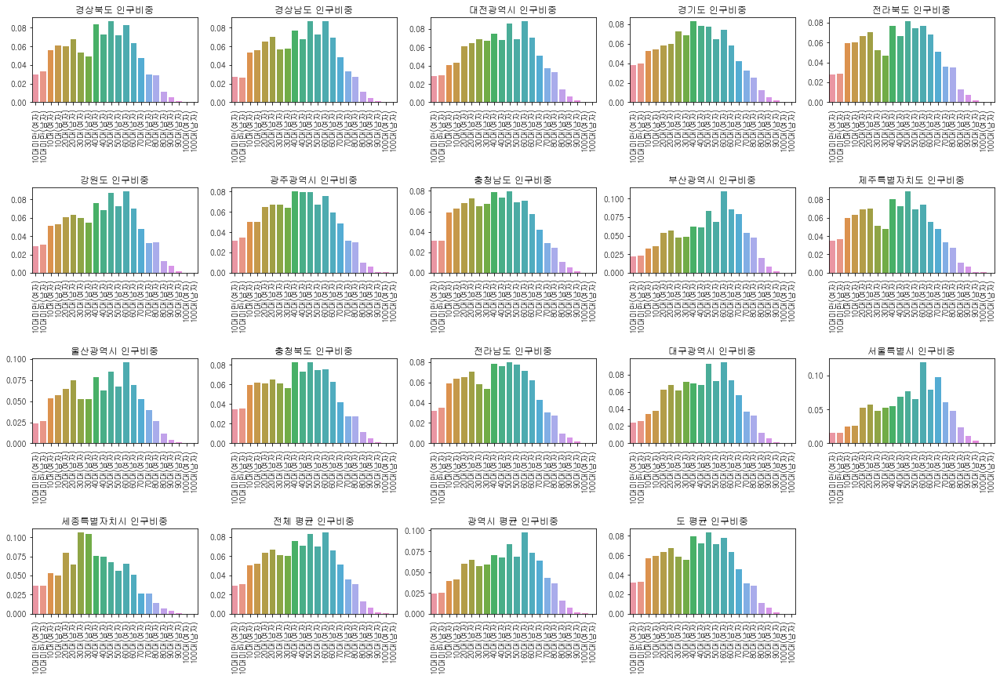

In [253]:
fig = plt.figure(figsize=(22, 18))
plt.xticks(rotation=90)
for i, n in enumerate(list(ag.index)):
    plt.subplot(5, 5, i+1)
    plt.subplots_adjust(hspace=1.0)
    plt.title("{} 인구비중".format(n))
    sns.barplot(data=ag.loc[ag.index == n])
    plt.xticks(rotation=90)

## Modeling

In [332]:
train.drop(['방개수', '전용면적구분'], axis=1, inplace=True)

In [334]:
test.drop(['방개수', '전용면적구분'], axis=1, inplace=True)

In [412]:
train.head()

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,면적당보증금,면적당임대료,환산보증금,세대수X환산보증금,건축연면적
0,C2483,900,아파트,경상북도,국민임대,39.72,134,38.0,A,15667000.0,103680.0,0.0,3.0,1425.0,1015.0,394436.052367,2610.271903,52369720.0,7.017542e+09,5322.48
1,C2483,900,아파트,경상북도,국민임대,39.72,15,38.0,A,15667000.0,103680.0,0.0,3.0,1425.0,1015.0,394436.052367,2610.271903,52369720.0,7.855458e+08,595.80
2,C2483,900,아파트,경상북도,국민임대,51.93,385,38.0,A,27304000.0,184330.0,0.0,3.0,1425.0,1015.0,525784.710187,3549.585981,92556820.0,3.563438e+10,19993.05
3,C2483,900,아파트,경상북도,국민임대,51.93,15,38.0,A,27304000.0,184330.0,0.0,3.0,1425.0,1015.0,525784.710187,3549.585981,92556820.0,1.388352e+09,778.95
4,C2483,900,아파트,경상북도,국민임대,51.93,41,38.0,A,27304000.0,184330.0,0.0,3.0,1425.0,1015.0,525784.710187,3549.585981,92556820.0,3.794830e+09,2129.13


In [413]:
# 공급유형 unstack
temp = train.groupby(['단지코드', '공급유형'])['전용면적별세대수'].sum().unstack().fillna(0)
train = pd.merge(train.loc[:, ~train.columns.isin(['공급유형'])], temp, on='단지코드')
temp = test.groupby(['단지코드', '공급유형'])['전용면적별세대수'].sum().unstack().fillna(0)
test = pd.merge(test.loc[:, ~test.columns.isin(['공급유형'])], temp, on='단지코드')

In [414]:
# 자격유형 unstack
temp = train.groupby(['단지코드', '자격유형'])['전용면적별세대수'].sum().unstack().fillna(0)
train = pd.merge(train.loc[:, ~train.columns.isin(['자격유형'])], temp, on='단지코드')
temp = test.groupby(['단지코드', '자격유형'])['전용면적별세대수'].sum().unstack().fillna(0)
test = pd.merge(test.loc[:, ~test.columns.isin(['자격유형'])], temp, on='단지코드')

In [415]:
# 면적당환산보증금세대수 합계로 산출
temp = train.groupby(['단지코드'])['세대수X환산보증금'].sum().reset_index()
train = pd.merge(train.loc[:, ~train.columns.isin(['세대수X환산보증금'])], temp, on='단지코드')
temp = test.groupby(['단지코드'])['세대수X환산보증금'].sum().reset_index()
test = pd.merge(test.loc[:, ~test.columns.isin(['세대수X환산보증금'])], temp, on='단지코드')

In [416]:
# 건축연면적 합계로 산출
temp = train.groupby(['단지코드'])['건축연면적'].sum().reset_index()
train = pd.merge(train.loc[:, ~train.columns.isin(['건축연면적'])], temp, on='단지코드')
temp = test.groupby(['단지코드'])['건축연면적'].sum().reset_index()
test = pd.merge(test.loc[:, ~test.columns.isin(['건축연면적'])], temp, on='단지코드')

In [417]:
# 실거주세대 대비 차량수의 지역 평균으로 오름차순 정렬
# Order를 주었습니다.
region_dict = {'서울특별시': 0,
               '경기도':1,
               '세종특별자치시':2,
               '경상북도':3,
               '대구광역시':4,
               '광주광역시':5,
               '충청북도':6,
               '전라남도':7,
               '전라북도':8,
               '강원도':9,
               '경상남도':10,
               '울산광역시':11,
               '제주특별자치도':12,
               '대전광역시':13,
               '충청남도':14,
               '부산광역시':15}

train['지역'] = train['지역'].map(region_dict)
test['지역'] = test['지역'].map(region_dict)

In [418]:
train.head()

,단지코드,총세대수,임대건물구분,지역,전용면적,전용면적별세대수,공가수,임대보증금,임대료,지하철,버스,단지내주차면수,등록차량수,면적당보증금,면적당임대료,환산보증금,공공분양,공공임대(10년),공공임대(50년),공공임대(5년),공공임대(분납),국민임대,영구임대,임대상가,장기전세,행복주택,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,세대수X환산보증금,건축연면적
0,C2483,900,아파트,3,39.72,134,38.0,15667000.0,103680.0,0.0,3.0,1425.0,1015.0,394436.052367,2610.271903,52369720.0,0.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.848731e+10,45605.89
1,C2483,900,아파트,3,39.72,15,38.0,15667000.0,103680.0,0.0,3.0,1425.0,1015.0,394436.052367,2610.271903,52369720.0,0.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.848731e+10,45605.89
2,C2483,900,아파트,3,51.93,385,38.0,27304000.0,184330.0,0.0,3.0,1425.0,1015.0,525784.710187,3549.585981,92556820.0,0.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.848731e+10,45605.89
3,C2483,900,아파트,3,51.93,15,38.0,27304000.0,184330.0,0.0,3.0,1425.0,1015.0,525784.710187,3549.585981,92556820.0,0.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.848731e+10,45605.89
4,C2483,900,아파트,3,51.93,41,38.0,27304000.0,184330.0,0.0,3.0,1425.0,1015.0,525784.710187,3549.585981,92556820.0,0.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.848731e+10,45605.89


In [419]:
# 전처리가 끝나서 필요없는 변수 삭제
train.drop(['임대건물구분', '전용면적', '전용면적별세대수', '임대보증금', '임대료', '환산보증금', '면적당보증금', '면적당임대료'], axis=1, inplace=True)
test.drop(['임대건물구분', '전용면적', '전용면적별세대수', '임대보증금', '임대료', '환산보증금', '면적당보증금', '면적당임대료'], axis=1, inplace=True)

# # 다중공선성을 띄고 있는 변수 삭제
# train.drop(['전용면적별세대수합'], axis=1, inplace=True)
# test.drop(['전용면적별세대수합'], axis=1, inplace=True)

In [420]:
# 단지고유의 레코드만 남겨줍니다.
train = train.drop_duplicates().reset_index(drop=True)
test = test.drop_duplicates().reset_index(drop=True)

In [421]:
train.shape, test.shape

((422, 35), (150, 28))

In [422]:
set(train.columns).difference(test.columns)

{'B', 'F', 'O', '공공분양', '공공임대(5년)', '등록차량수', '장기전세'}

In [423]:
train.drop(['B', 'F', 'O', '공공분양','공공임대(5년)', '장기전세'], axis=1, inplace=True)

In [424]:
# test['B'] = 0
# test['F'] = 0
# test['O'] = 0
# test['공공분양'] = 0
# test['공공임대(5년)'] = 0
# test['장기전세'] = 0

In [425]:
train.shape, test.shape

((422, 29), (150, 28))

In [426]:
train

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수,공공임대(10년),공공임대(50년),공공임대(분납),국민임대,영구임대,임대상가,행복주택,A,C,D,E,G,H,I,J,K,L,M,N,세대수X환산보증금,건축연면적
0,C2483,900,3,38.0,0.0,3.0,1425.0,1015.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.848731e+10,45605.89
1,C2515,545,10,17.0,0.0,3.0,624.0,205.0,0.0,0.0,0.0,545.0,0.0,0.0,0.0,545.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.069148e+10,21941.82
2,C1407,1216,13,13.0,1.0,1.0,1285.0,1064.0,0.0,0.0,0.0,1216.0,0.0,0.0,0.0,1216.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.072339e+11,49159.08
3,C1945,755,1,6.0,1.0,3.0,734.0,730.0,0.0,0.0,0.0,755.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.703930e+10,37962.15
4,C1470,696,8,14.0,0.0,2.0,645.0,553.0,0.0,0.0,0.0,696.0,0.0,0.0,0.0,696.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.440690e+10,31250.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417,C2586,90,12,7.0,0.0,3.0,66.0,57.0,0.0,0.0,0.0,0.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,6.485653e+09,2638.32
418,C2035,492,9,24.0,0.0,1.0,521.0,246.0,0.0,0.0,0.0,492.0,0.0,0.0,0.0,492.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.810053e+10,18873.12
419,C2020,40,15,7.0,1.0,2.0,25.0,19.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,0.0,0.0,2.917030e+09,1017.55
420,C2437,90,6,12.0,0.0,1.0,30.0,16.0,0.0,0.0,0.0,0.0,90.0,0.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.357046e+09,2234.70


In [427]:
x_train = train.loc[:, ~train.columns.isin(['단지코드', '등록차량수'])]
y_train = train['등록차량수']
x_test = test.loc[:, ~test.columns.isin(['단지코드'])]

In [428]:
x_train.shape, y_train.shape, x_test.shape

((422, 27), (422,), (150, 27))

In [429]:
rf = RandomForestRegressor(random_state=42, oob_score=True, criterion='mse', n_estimators=200)
rf.fit(x_train, y_train)
pred = rf.predict(x_test)

In [430]:
rf.oob_score_

0.7670142058629235

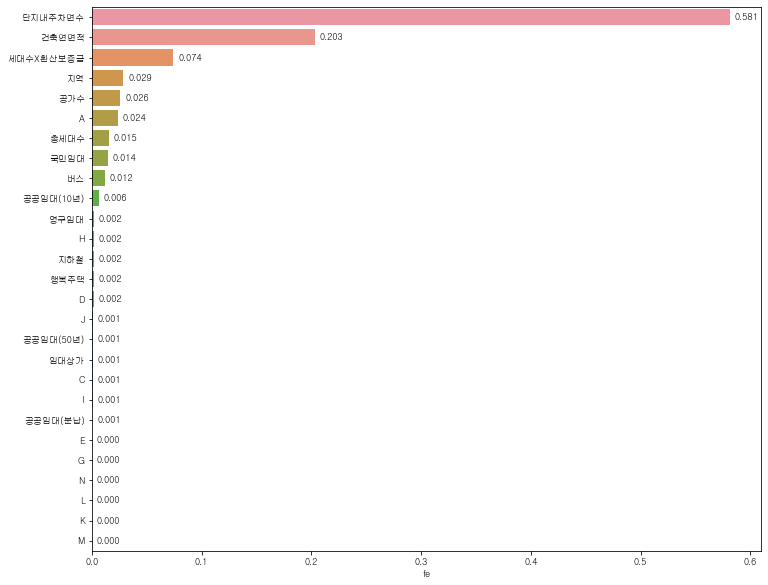

In [431]:
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.rcParams["font.size"] = "9"

fe_avg = pd.DataFrame(rf.feature_importances_,
                      index=x_train.columns, columns=['fe']).sort_values(by=['fe'], ascending=False)

plt.figure(figsize=(12, 10))
plots = sns.barplot(fe_avg.fe, y=fe_avg.index)

# Annotate every single Bar with its value, based on it's width           
for bar in plots.patches:
    width = bar.get_width()
    plt.text(0.015+ bar.get_width(),
             bar.get_y() + 0.5 * bar.get_height(),
             '{:.3f}'.format(width),
             ha='center', va='center')

plt.show()

In [432]:
sub.num = pred

In [433]:
sub

,code,num
0,C1072,780.415
1,C1128,1158.600
2,C1456,505.880
3,C1840,535.510
4,C1332,1233.970
...,...,...
145,C2456,210.385
146,C1266,487.705
147,C2152,33.845
148,C1267,385.515


In [435]:
sub.to_csv('submission/parking_210704_resetPreprocessedonleymerge.csv', index=False)

### age_gender 추가

In [359]:
ag = age_gender.set_index('지역')

In [360]:
# 성인(20대~60대)비중합
ag.loc[:, '청년비중'] = ag.loc[:, (ag.columns.str.contains('20대')) | (ag.columns.str.contains('30대')) | (ag.columns.str.contains('40대')) | (ag.columns.str.contains('50대')) | (ag.columns.str.contains('60대'))].sum(axis=1)
# 미성년자(10대이하)비중
ag.loc[:, '미성년자비중'] = ag.loc[:, (ag.columns.str.contains('10대'))].sum(axis=1)
# 노인비중(70대~)비중합
ag.loc[:, '노년비중'] = ag.loc[:, (ag.columns.str.contains('70대')) | (ag.columns.str.contains('80대')) | (ag.columns.str.contains('90대')) | (ag.columns.str.contains('100대'))].sum(axis=1)
# 성인여성비중
ag.loc[:, '청년여성비중'] = ag.loc[:, ['20대(여자)', '30대(여자)', '40대(여자)', '50대(여자)', '60대(여자)']].sum(axis=1)
# 성인남성비중
ag.loc[:, '청년남성비중'] = ag.loc[:, ['20대(남자)', '30대(남자)', '40대(남자)', '50대(남자)', '60대(남자)']].sum(axis=1)

In [361]:
ag = ag.reset_index()
ag['지역'] = ag['지역'].map(region_dict)

In [362]:
train = pd.merge(train, ag, how='left', on='지역')
test = pd.merge(test, ag, how='left', on='지역')

In [363]:
train.shape, test.shape

((422, 56), (150, 55))

In [364]:
x_train = train.loc[:, ~train.columns.isin(['단지코드', '등록차량수'])]
y_train = train['등록차량수']
x_test = test.loc[:, ~test.columns.isin(['단지코드'])]

In [365]:
x_train.shape, y_train.shape, x_test.shape

((422, 54), (422,), (150, 54))

In [366]:
rf = RandomForestRegressor(random_state=42, oob_score=True, criterion='mse', n_estimators=200)
rf.fit(x_train, y_train)
pred = rf.predict(x_test)

In [367]:
rf.oob_score_

0.773963594994252

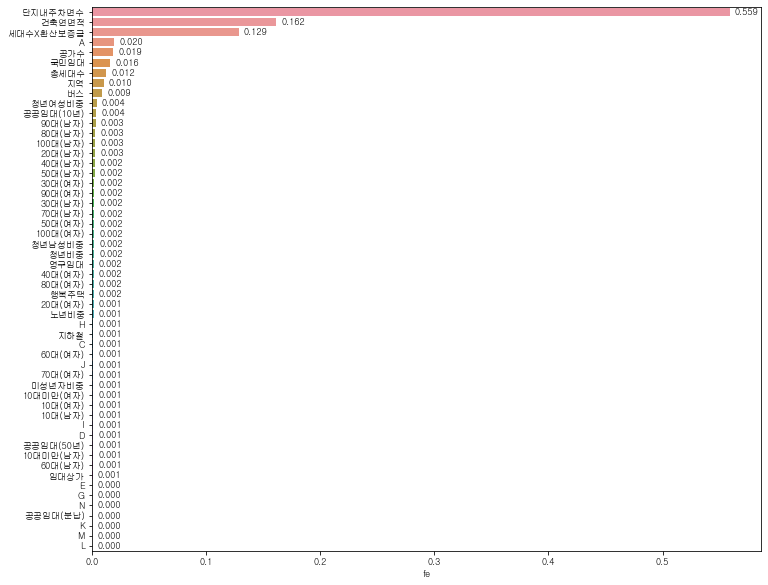

In [368]:
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.rcParams["font.size"] = "9"

fe_avg = pd.DataFrame(rf.feature_importances_,
                      index=x_train.columns, columns=['fe']).sort_values(by=['fe'], ascending=False)

plt.figure(figsize=(12, 10))
plots = sns.barplot(fe_avg.fe, y=fe_avg.index)

# Annotate every single Bar with its value, based on it's width           
for bar in plots.patches:
    width = bar.get_width()
    plt.text(0.015+ bar.get_width(),
             bar.get_y() + 0.5 * bar.get_height(),
             '{:.3f}'.format(width),
             ha='center', va='center')

plt.show()

In [369]:
sub.num = pred

In [372]:
sub

,code,num
0,C1072,778.750
1,C1128,1129.310
2,C1456,501.880
3,C1840,518.855
4,C1332,1195.270
...,...,...
145,C2456,254.605
146,C1266,518.845
147,C2152,37.200
148,C1267,373.330


In [373]:
sub.to_csv('submission/parking_210704_resetPreprocessed+agegender.csv', index=False)

In [799]:
x_train = train.loc[:, ~train.columns.isin(['단지코드', '등록차량수'])]
y_train = train['등록차량수']
x_test = test.loc[:, ~test.columns.isin(['단지코드'])]

In [800]:
x_train.shape, y_train.shape, x_test.shape

((423, 54), (423,), (150, 54))

In [802]:
rf = RandomForestRegressor(random_state=42, oob_score=True, max_features='sqrt',
                           criterion='mse', n_estimators=200)
rf.fit(x_train, y_train)
pred = rf.predict(x_test)

In [803]:
rf.oob_score_

0.7558609622960923

In [805]:
rf = RandomForestRegressor(random_state=42, oob_score=True, max_features='log2',
                           criterion='mse', n_estimators=200)
rf.fit(x_train, y_train)
pred = rf.predict(x_test)

In [806]:
rf.oob_score_

0.7585001497045425

In [807]:
rf = RandomForestRegressor(random_state=42, oob_score=True, max_features=10,
                           criterion='mse', n_estimators=200)
rf.fit(x_train, y_train)
pred = rf.predict(x_test)

In [808]:
rf.oob_score_

0.7660095797666504

In [811]:
preds = []
for i in range(10, len(x_train.columns)):
    rf = RandomForestRegressor(random_state=42, oob_score=True, max_features=i,
                               criterion='mse', n_estimators=200)
    rf.fit(x_train, y_train)
    pred = rf.predict(x_test)
    preds.append(pred)
    print(i, rf.oob_score_)

10 0.7660095797666504
11 0.7611610877456199
12 0.7667078058615786
13 0.7595966067918127
14 0.7618725562115314
15 0.7606918429600558
16 0.7644623370500059
17 0.7692500319625013
18 0.7700550462816877
19 0.7668824728480799
20 0.7658064187020692
21 0.7653008983204862
22 0.7694822937188683
23 0.7660717809052797
24 0.7709254976187695
25 0.7712192368220969
26 0.7734671853390201
27 0.7652991513176777
28 0.7753194733224524
29 0.7689195190532163
30 0.7698200787374131
31 0.770104721666701
32 0.7709768780332024
33 0.7675499056721224
34 0.7696144160933189
35 0.7709546567257438
36 0.7676879032301567
37 0.7740871425617329
38 0.7727735322406263
39 0.7676029313685063
40 0.7760634721156373
41 0.7705172799434493
42 0.7684899922059875
43 0.7706747748004055
44 0.7762341800307195
45 0.7726182884234438
46 0.7700878303817938
47 0.7718742148843482
48 0.7747421461088501
49 0.7693064388037438
50 0.7707536480482376
51 0.7747108257258398
52 0.7733979137746
53 0.7715465578128706


In [820]:
np.array(preds).mean(axis=0)

array([ 757.80045455, 1125.82375   ,  499.18522727,  518.78926136,
       1189.66977273, 1962.08045455,  976.11431818,  514.70386364,
        350.24340909,  228.09306818,  504.08318182,  230.69295455,
        423.04375   ,  279.56204545,  314.23954545,  301.85272727,
        524.38034091,  312.78875   ,  211.60193182,  591.48045455,
        198.39636364,  501.69988636,  509.13659091,  500.53454545,
        423.13965909,  140.78420455,  146.32545455,  653.81909091,
        447.73806818,  553.3325    ,  919.97568182,  172.22840909,
        541.39943182,  234.78079545,   93.6125    ,  327.87909091,
        411.31522727,  625.23409091,  812.64306818,  325.30215909,
        369.15261364,  536.25931818,  503.44863636,  623.88045455,
        822.51045455, 1433.61113636,  485.83102273,  626.23715909,
        431.85181818,  348.81897727,  812.34659091,  262.80136364,
       1008.63988636,  685.81261364,  627.3775    ,  275.39329545,
        679.15159091,  231.23227273,  481.62556818,  127.95034

In [821]:
sub.num = np.array(preds).mean(axis=0)

In [822]:
sub

,code,num
0,C1072,757.800455
1,C1128,1125.823750
2,C1456,499.185227
3,C1840,518.789261
4,C1332,1189.669773
...,...,...
145,C2456,264.651932
146,C1266,513.178977
147,C2152,41.871364
148,C1267,381.182955


In [823]:
sub.to_csv('submission/parking_210702_resetPreprocessed+agegender+maxfeatures.csv', index=False)

# 창고

#### 총세대수와 단지내주차면수

총세대수에 비해 단지내주차면수가 너무 크거나 작은 단지가 있습니다.

In [83]:
train_danji['주차면수/총세대수'] = train_danji['단지내주차면수'] / train_danji['총세대수']

In [84]:
train_danji.nlargest(5, '주차면수/총세대수')

,단지코드,총세대수,지역,공가수,지하철,버스,단지내주차면수,등록차량수,주차면수/총세대수
326,C2431,472,경상남도,16.0,0.0,2.0,1066.0,359.0,2.258475
317,C1649,575,경상남도,15.0,0.0,7.0,1066.0,855.0,1.853913
0,C2483,900,경상북도,38.0,0.0,3.0,1425.0,1015.0,1.583333
197,C1410,356,충청북도,10.0,0.0,3.0,550.0,815.0,1.544944
138,C1988,475,전라남도,12.0,0.0,2.0,722.0,402.0,1.520000


크게 양보해서 세대 당 2대의 차를 가지고 있다고 칩시다. 근데 4.3대는 말이 안됩니다. 아니 사실 1.85대도 말이 안돼요.

In [723]:
# 서울특별시의 총세대수/단지내주차면수 비율을 단지내주차면수에 곱한 값으로 총세대수를 다시 넣겠습니다.
train.loc[train['단지코드'] == 'C1397', '총세대수'] = (
    train.loc[train['단지코드'] == 'C1397', '단지내주차면수'].unique()[0] * 
    (
        train_danji.loc[(train_danji['지역'] == '서울특별시') & (train_danji['단지코드'] != 'C1397')]['총세대수'].sum()
        / train_danji.loc[(train_danji['지역'] == '서울특별시') & (train_danji['단지코드'] != 'C1397')]['단지내주차면수'].sum()
    )
).round()

In [724]:
# # 문제는 전용면적별세대수와 임대료입니다.
# train = train.append({'단지코드': 'C1397',
#               '총세대수': train.loc[train['단지코드'] == 'C1397', '총세대수'].unique()[0],
#               '임대건물구분': '아파트',
#               '지역': train.loc[train['단지코드'] == 'C1397', '지역'].unique()[0],
#               '공급유형': '장기전세',
#               '전용면적': 74.99,
#               '전용면적별세대수': (
#                   train.loc[train['단지코드'] == 'C1397', '총세대수'].unique()[0]
#                    - train.loc[train['단지코드'] == 'C1397'].groupby(['단지코드'])['전용면적별세대수'].sum()[0]
#               ),
#               '공가수': train.loc[train['단지코드'] == 'C1397', '공가수'].unique()[0],
#               '자격유형': 'A',
#               '지하철': train.loc[train['단지코드'] == 'C1397', '지하철'].unique()[0],
#               '버스': train.loc[train['단지코드'] == 'C1397', '버스'].unique()[0],
#               '단지내주차면수': train.loc[train['단지코드'] == 'C1397', '단지내주차면수'].unique()[0],
#               '등록차량수': train.loc[train['단지코드'] == 'C1397', '등록차량수'].unique()[0]
#                      }, ignore_index=True)

In [85]:
test_danji.nlargest(5, '주차면수/총세대수')

KeyError: '주차면수/총세대수'

In [726]:
# 서울특별시의 총세대수/단지내주차면수 비율을 단지내주차면수에 곱한 값으로 총세대수를 다시 넣겠습니다.
test.loc[test['단지코드'] == 'C2335', '총세대수'] = (
    test.loc[test['단지코드'] == 'C2335', '단지내주차면수'].unique()[0] * 
    (
        train_danji.loc[(train_danji['지역'] == '전라북도') & (train_danji['단지코드'] != 'C2335')]['총세대수'].sum()
        / train_danji.loc[(train_danji['지역'] == '전라북도') & (train_danji['단지코드'] != 'C2335')]['단지내주차면수'].sum()
    )
).round()

In [727]:
# # 문제는 전용면적별세대수와 임대료입니다.
# test = test.append({'단지코드': 'C2335',
#               '총세대수': test.loc[test['단지코드'] == 'C2335', '총세대수'].unique()[0],
#               '임대건물구분': '아파트',
#               '지역': test.loc[test['단지코드'] == 'C2335', '지역'].unique()[0],
#               '공급유형': '국민임대',
#               '전용면적': test.loc[test['단지코드'] == 'C2335', '전용면적'].max(),
#               '전용면적별세대수': (
#                   test.loc[test['단지코드'] == 'C2335', '총세대수'].unique()[0]
#                    - test.loc[test['단지코드'] == 'C2335'].groupby(['단지코드'])['전용면적별세대수'].sum()[0]
#               ),
#               '공가수': test.loc[test['단지코드'] == 'C2335', '공가수'].unique()[0],
#               '자격유형': test.loc[test['단지코드'] == 'C2335', '자격유형'].mode()[0],
#               '지하철': test.loc[test['단지코드'] == 'C2335', '지하철'].unique()[0],
#               '버스': test.loc[test['단지코드'] == 'C2335', '버스'].unique()[0],
#               '단지내주차면수': test.loc[test['단지코드'] == 'C2335', '단지내주차면수'].unique()[0]
#                      }, ignore_index=True)